In [6]:
import ROOT
from ROOT import TFile
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import copy
import pandas as pd 
import time
import uproot
import uproot3
import R2h_module_2d as r2h
import root_pandas as rpd
from root_pandas import read_root
from matplotlib import rc
import seaborn as sns
import cupy as cp, math, pylab
import os, os.path
mpl.rcParams.update({'font.size': 18})
mpl.rcParams.update({'legend.fontsize': 20})
mpl.rcParams.update({'xtick.labelsize': 13}) 
mpl.rcParams.update({'ytick.labelsize': 13}) 
mpl.rcParams.update({'text.usetex' : False})
rc('font', weight='bold')
colors = {}
colors['C'] = '#1f77b4'
colors['Fe'] = '#ff7f0e'
colors['Pb']=  '#2ca02c'


plt.rcParams['figure.facecolor']='white'
plt.rcParams['savefig.facecolor']='white'
plt.rcParams['savefig.bbox']='tight'

Welcome to JupyROOT 6.27/01


/home/sebouh/.local/lib/python3.8/site-packages/uproot3/__init__.py:127: FutureWarning: Consider switching from 'uproot3' to 'uproot', since the new interface became the default in 2020.

    pip install -U uproot

In Python:

    >>> import uproot
    >>> with uproot.open(...) as file:
    ...

  warnings.warn(
/home/sebouh/.local/lib/python3.8/site-packages/awkward0/__init__.py:12: FutureWarning: Consider switching from 'awkward0' to 'awkward', since the new interface became the default in 2020.

    pip install -U awkward

In Python:

    >>> import awkward as ak
    >>> new_style_array = ak.from_awkward0(old_style_array)
    >>> old_style_array = ak.to_awkward0(new_style_array)

  warnings.warn(


<ipython-input-7-243edb311240>:19: MatplotlibDeprecationWarning: Axes3D(fig) adding itself to the figure is deprecated since 3.4. Pass the keyword argument auto_add_to_figure=False and use fig.add_axes(ax) to suppress this warning. The default value of auto_add_to_figure will change to False in mpl3.5 and True values will no longer work in 3.6.  This is consistent with other Axes classes.
  ax = Axes3D(fig)


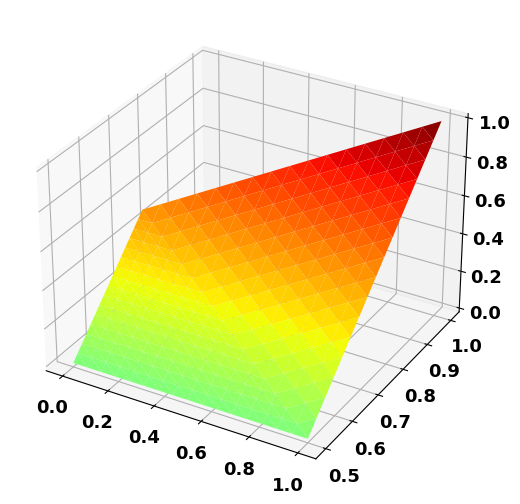

In [7]:
#test triangular interpolation
import numpy
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt
from matplotlib import tri, cm

x = numpy.array([0, 0, 1, 1])
y = numpy.array([0.5, 0.75, 1, 0.5])
z = numpy.array([0, 0.5, 1, 0])

triang = tri.Triangulation(x, y)
refiner = tri.UniformTriRefiner(triang)
new, new_z = refiner.refine_field(z, subdiv=4)

norm = plt.Normalize(vmax=abs(y).max(), vmin=-abs(y).max())
kwargs = dict(triangles=new.triangles, cmap=cm.jet, norm=norm, linewidth=0.2)

fig = plt.figure()
ax = Axes3D(fig)
pt = ax.plot_trisurf(new.x, new.y, new_z, **kwargs)
plt.show()

**Definition of some constants**

In [8]:
#change this to where you want to save the output plots

plots_dir='/home/sebouh/Documents/Overleaf_git/Dihadron2D_AN/figures/results/main/'
tables_dir='/home/sebouh/Documents/Overleaf_git/Dihadron2D_AN/tables'

#plots_dir='/home/sebouh/Documents/Overleaf_git/Dipion2D_CM_6_21_2022/images'

# Get data from Ntuples to dataframes

In [9]:
def getdatainChunks(filename,treename):
    dataframe =pd.DataFrame()
    file = uproot.open(filename) 
    tree=file[treename]
    df=tree.arrays(filter_name='*',library='pd')
    return df

# Getting Data

In [10]:
%%time
df = {}
df_trigger = {}
#path_data="/home/sebouh/di-hadron"
path_data="/home/seba/di-hadron/P27"
for target in ['C','Fe','Pb']:
    print ('Getting dataframes from target %s'%target)
    df[target]=getdatainChunks('%s/Pairs_%s.root'%(path_data,target), target)
    df['D_%s'%target]= getdatainChunks('%s/Pairs_%s.root'%(path_data,target), 'D_%s'%target)  
    print ('Get trigger dataframes from deuterium target %s'%target)
    df_trigger['%s_trigger'%target] = getdatainChunks('%s/Pairs_%s.root'%(path_data,target), 
                                                      '%s_trigger'%target)
    df_trigger['D_%s_trigger'%target] = getdatainChunks('%s/Pairs_%s.root'%(path_data,target), 
                                                        'D_%s_trigger'%target)

Getting dataframes from target C
Get trigger dataframes from deuterium target C
Getting dataframes from target Fe
Get trigger dataframes from deuterium target Fe
Getting dataframes from target Pb
Get trigger dataframes from deuterium target Pb
CPU times: user 4.11 s, sys: 346 ms, total: 4.46 s
Wall time: 4.78 s


In [11]:
print(df['C'].columns)

Index(['dphi', 'dphi_lab', 'drap', 'h1_z', 'h2_z', 'h1_cm_pt', 'h2_cm_pt',
       'h1_xf', 'h2_xf', 'h1_rap', 'ycm', 'h2_rap', 'h1_pid', 'h2_pid',
       'h1_cm_ph', 'h2_cm_ph', 'h1_cm_th', 'h2_cm_th', 'pair_mass', 'pair_pt',
       'mx_eh1h2x', 'mx_eh1x', 'mx_eh2x', 't', 'Q2', 'nu', 'W', 'SampFracEl25',
       'SampFracEl20', 'TargTypeSM', 'TargType', 'x', 'u', 'h1_ph', 'h1_th',
       'h2_ph', 'h2_th', 'h1_deltaZ', 'h2_deltaZ', 'h1_Nphe', 'h2_Nphe',
       'h1_Sector', 'h2_Sector', 'h1_FidCut', 'h2_FidCut', 'h1_Chi2CC',
       'h2_Chi2CC', 'h1_StatCC', 'h2_StatCC', 'evnt'],
      dtype='object')


In [12]:
#df['C'].hist(figsize=(12,12),bins=100,column=['nu','t','Q2','h2_pid', 'h1_pid','h1_xf', 'h2_xf'])
#plt.show()

# Getting GiBUU

In [13]:
%%time

pathGIBUU="/home/miguel/eg2dihadron/"
for target in ['D','C','Fe','Pb']:
    #GiBUU
    print (target)
    print (' trigger')
    df_trigger['GiBUU_%s_trigger'%target]= getdatainChunks('%sGiBUU_Pairs_%s.root'%(pathGIBUU,target), 
                                                           '%s_trigger'%target)
    print (' pairs')
    df['GiBUU_%s'%target]= getdatainChunks('%sGiBUU_Pairs_%s.root'%(pathGIBUU,target), target)
print (df_trigger.keys())

D
 trigger
 pairs
C
 trigger
 pairs
Fe
 trigger
 pairs
Pb
 trigger
 pairs
dict_keys(['C_trigger', 'D_C_trigger', 'Fe_trigger', 'D_Fe_trigger', 'Pb_trigger', 'D_Pb_trigger', 'GiBUU_D_trigger', 'GiBUU_C_trigger', 'GiBUU_Fe_trigger', 'GiBUU_Pb_trigger'])
CPU times: user 14.9 s, sys: 702 ms, total: 15.6 s
Wall time: 17.2 s


# Apply selection to datasets
**Here are applied the cuts for GiBUU**

In [14]:
%%time
for key in df.keys():
    isMC = False
    if 'GiBUU' in key:
        isMC=True
    print ('\nkey: ',key)
    df[key].rename(columns={'h1_FidCut':'h1_FidCutPiPlus'}, inplace=True)
    df[key].rename(columns={'h2_FidCut':'h2_FidCutPiPlus'}, inplace=True)
    df[key] = r2h.applyCuts(df[key],isMC=isMC, nomCuts=True)
    df[key] = r2h.applyCutsPair(df[key],isMC=isMC, nomCuts=True)


key:  C
Starting election on dipion variables
This is Data
1.0< Q2 <4.0 44785  (100.00  %)
2.2 < nu < 4.2 44785  (100.00  %)
10<h2_th 35415  (100.00  %)
10< h1_th 32420  (100.00  %)

key:  D_C
Starting election on dipion variables
This is Data
1.0< Q2 <4.0 67923  (100.00  %)
2.2 < nu < 4.2 67923  (100.00  %)
10<h2_th 57108  (100.00  %)
10< h1_th 52003  (100.00  %)

key:  Fe
Starting election on dipion variables
This is Data
1.0< Q2 <4.0 44134  (100.00  %)
2.2 < nu < 4.2 44134  (100.00  %)
10<h2_th 34975  (100.00  %)
10< h1_th 32056  (100.00  %)

key:  D_Fe
Starting election on dipion variables
This is Data
1.0< Q2 <4.0 96623  (100.00  %)
2.2 < nu < 4.2 96623  (100.00  %)
10<h2_th 82731  (100.00  %)
10< h1_th 75297  (100.00  %)

key:  Pb
Starting election on dipion variables
This is Data
1.0< Q2 <4.0 15667  (100.00  %)
2.2 < nu < 4.2 15667  (100.00  %)
10<h2_th 12349  (100.00  %)
10< h1_th 11283  (100.00  %)

key:  D_Pb
Starting election on dipion variables
This is Data
1.0< Q2 <4.0 10

In [15]:
for key in df_trigger.keys():
    isMC = False
    if 'GiBUU' in key:
        isMC=True    
    print (key, isMC)
    df_trigger[key].rename(columns={'h1_FidCut':'h1_FidCutPiPlus'}, inplace=True)
    df_trigger[key] = r2h.applyCuts(df_trigger[key],isTrigger=True, isMC=isMC, nomCuts=True)
    print (' ')
    
    

C_trigger False
 
D_C_trigger False
 
Fe_trigger False
 
D_Fe_trigger False
 
Pb_trigger False
 
D_Pb_trigger False
 
GiBUU_D_trigger True
 
GiBUU_C_trigger True
 
GiBUU_Fe_trigger True
 
GiBUU_Pb_trigger True
 


In [16]:
df['GiBUU_C'].columns

Index(['dphi', 'dphi_lab', 'qt', 'drap', 'h1_z', 'h2_z', 'z_tot', 'h1_xf',
       'h2_xf', 'h1_rap', 'ycm', 'h2_rap', 'h1_pid', 'h2_pid', 'h1_cm_ph',
       'h2_cm_ph', 'h1_cm_th', 'h2_cm_th', 'pair_mass', 'pair_pt', 'mx_eh1h2',
       'Q2', 'x', 'nu', 'W', 'h1_ph', 'h1_th', 'h2_ph', 'h2_th', 'pos_x',
       'pos_y', 'pos_z', 'pos_x_asso', 'pos_y_asso', 'pos_z_asso', '__index__',
       'inelasticity', 'h1_e', 'h1_p', 'h2_e', 'h2_p', 'pair_pt2'],
      dtype='object')

In [17]:
#define the cuts used for the data.  These should be cleaned up for clarity
p_thr=2.7
Nphe_thr=5
minz2=0.05
maxz2=0.95
Nphe_h1_cut='h1_Nphe> (%d*( (h1_z*nu*h1_z*nu-0.13957*0.13957)>(%f*%f) and h1_pid==211 ) -10000* (not ( (h1_z*nu*h1_z*nu-0.13957*0.13957)>(%f*%f) and h1_pid==211 ) ) )'%(Nphe_thr,p_thr,p_thr,p_thr,p_thr)                    
Nphe_h2_cut='h2_Nphe> (%d*( (h2_z*nu*h2_z*nu-0.13957*0.13957)>(%f*%f) and h2_pid==211 ) -10000* (not ( (h2_z*nu*h2_z*nu-0.13957*0.13957)>(%f*%f) and h2_pid==211 ) ) )'%(Nphe_thr,p_thr,p_thr,p_thr,p_thr)                    
Chi2CC_h1_cut='h1_Chi2CC < (0.08726*( (h1_z*nu*h1_z*nu-0.13957*0.13957)>(%f*%f) and h1_pid==211 ) +10000* (not ( (h1_z*nu*h1_z*nu-0.13957*0.13957)>(%f*%f) and h1_pid==211 ) ) )'%(p_thr,p_thr,p_thr,p_thr)
Chi2CC_h2_cut='h2_Chi2CC < (0.08726*( (h2_z*nu*h2_z*nu-0.13957*0.13957)>(%f*%f) and h2_pid==211 ) +10000* (not ( (h2_z*nu*h2_z*nu-0.13957*0.13957)>(%f*%f) and h2_pid==211 ) ) )'%(p_thr,p_thr,p_thr,p_thr)
StatCC_h1_cut='h1_StatCC>((( (h1_z*nu*h1_z*nu-0.13957*0.13957)>(%f*%f) and h1_pid==211 ) -1 ))'%(p_thr,p_thr)
StatCC_h2_cut='h2_StatCC>((( (h2_z*nu*h2_z*nu-0.13957*0.13957)>(%f*%f) and h2_pid==211 ) -1 ))'%(p_thr,p_thr)



pair_cut_nom  ='and h1_th>10 and h2_th>10 and h1_z>0.5 and h2_z>%s and h2_z<%s and (h1_p+h2_p)<nu and (h1_pid*h2_pid)<0.  and abs(h2_deltaZ)<3.0 and abs(h1_deltaZ)<3.0 and TargType!=0 and SampFracEl25==1 and h1_FidCutPiPlus==1 and h2_FidCutPiPlus==1 and %s and %s and %s and %s and %s and %s'%(minz2,maxz2, Nphe_h1_cut, Nphe_h2_cut,Chi2CC_h1_cut,Chi2CC_h2_cut,StatCC_h1_cut, StatCC_h2_cut)
trigger_cut_nom   ='h1_z>0.5 and h1_th>10 and abs(h1_deltaZ)<3.0 and TargType!=0 and SampFracEl25==1 and h1_FidCutPiPlus==1 and %s and %s and %s  '%(Nphe_h1_cut, Chi2CC_h1_cut,StatCC_h1_cut)

In [18]:
#set up some things regarding plotting style
import imp
imp.reload(mpl)
import mplhep as hep
hep.set_style("CMS")

symbols={"C":"o","Fe":"s", "Pb": "v"}
linestyles={"C":"-", "Fe":"--","Pb":"-."}

<ipython-input-18-fc33797c1d1a>:5: FutureWarning: ``set_style`` is deprecated: Naming convention is changing to match mpl. Use ``mplhep.style.use()``.
  hep.set_style("CMS")


# Determine the R2h values for each of the binnings.

In [19]:
import imp
import R2h_module_2d as r2h
imp.reload(r2h)
dphidy={}

trigger_cut_pid = {"+-":" and h1_pid==211","-+":" and h1_pid==-211"}
binsdy= {"+-": np.linspace(0, 3, 7), "-+": np.linspace(-0.5, 2, 6)}
for charge in "+-", "-+":
    for target in "C Fe Pb".split():
        
        dphidy[target+charge+"_data"]=r2h.getRatio2d(df['%s'%target], df['D_%s'%target], 
                                df_trigger['%s_trigger'%target], df_trigger['D_%s_trigger'%target],
                                varx="dphi", vary='drap', bins=[np.linspace(0, np.pi, 9), binsdy[charge]],
                                    pair_cut = '%s and h2_z>0.05 and h2_z<0.45 and h1_cm_pt**2>0.005 and h2_cm_pt**2>0.005 and h1_z+h2_z<0.95'%pair_cut_nom,
                                    trig_cut = '%s'%trigger_cut_nom +trigger_cut_pid[charge] + " and h1_cm_pt**2>0.005")
        dphidy[target+charge+"_GiBUU"]=r2h.getRatio2d(df['GiBUU_%s'%target],df['GiBUU_D'],
                                df_trigger['GiBUU_%s_trigger'%target],df_trigger['GiBUU_D_trigger'],
                                varx="dphi", vary='drap', bins=[np.linspace(0, np.pi, 9), binsdy[charge]],
                                    pair_cut='and h2_z>0.05 and h2_z<0.45 and h1_z+h2_z<0.95',
                                   trig_cut='h1_z>0.5'+trigger_cut_pid[charge])
        


In [20]:
import imp
import R2h_module_2d as r2h
imp.reload(r2h)
z1z2={}

trigger_cut_pid = {"+-":" and h1_pid==211","-+":" and h1_pid==-211"}
for charge in "+-", "-+":
    for target in "C Fe Pb".split():
        
        z1z2[target+charge+"_data"]=r2h.getRatio2d(df['%s'%target], df['D_%s'%target], 
                                df_trigger['%s_trigger'%target], df_trigger['D_%s_trigger'%target],
                                varx="h2_z", vary='h1_z', bins=[np.linspace(.05, 0.45, 9), np.linspace(0.5, 0.90, 9)],
                                    pair_cut = '%s and h2_z>0.05 and h2_z<0.45 and h1_z+h2_z<0.95'%pair_cut_nom,
                                    trig_cut = '%s'%trigger_cut_nom +trigger_cut_pid[charge])
        z1z2[target+charge+"_GiBUU"]=r2h.getRatio2d(df['GiBUU_%s'%target],df['GiBUU_D'],
                                df_trigger['GiBUU_%s_trigger'%target],df_trigger['GiBUU_D_trigger'],
                                varx="h2_z", vary='h1_z', bins=[np.linspace(.05, 0.45, 9), np.linspace(0.5, 0.90, 9)],
                                    pair_cut='and h2_z>0.05 and h2_z<0.45 and h1_z+h2_z<0.95',
                                   trig_cut='h1_z>0.5'+trigger_cut_pid[charge])

/home/sebouh/di-hadron/R2h_module_2d.py:52: RuntimeWarning: invalid value encountered in true_divide
  ratio_conditional = np.true_divide(z_A,z_D)
/home/sebouh/di-hadron/R2h_module_2d.py:54: RuntimeWarning: divide by zero encountered in true_divide
  error_conditional=ratio_conditional*np.sqrt(1/n_A+1/n_D)
/home/sebouh/di-hadron/R2h_module_2d.py:52: RuntimeWarning: divide by zero encountered in true_divide
  ratio_conditional = np.true_divide(z_A,z_D)
/home/sebouh/di-hadron/R2h_module_2d.py:54: RuntimeWarning: invalid value encountered in multiply
  error_conditional=ratio_conditional*np.sqrt(1/n_A+1/n_D)


In [24]:
import imp
import R2h_module_2d as r2h
imp.reload(r2h)
z1dR={}

trigger_cut_pid = {"+-":" and h1_pid==211","-+":" and h1_pid==-211"}
for charge in "+-", "-+":
    for target in "C Fe Pb".split():
        
        z1dR[target+charge+"_data"]=r2h.getRatio2d(df['%s'%target], df['D_%s'%target], 
                                df_trigger['%s_trigger'%target], df_trigger['D_%s_trigger'%target],
                                varx="sqrt(dphi**2+drap**2)", vary='h1_z', bins=[np.linspace(0, 4, 5), np.linspace(0.5, 0.9, 5)],
                                    pair_cut = '%s and h2_z>0.05 and h2_z<0.45 and h1_cm_pt**2>0.005 and h2_cm_pt**2>0.005 and h1_z+h2_z<0.95'%pair_cut_nom,
                                    trig_cut = '%s'%trigger_cut_nom +trigger_cut_pid[charge] + " and h1_cm_pt**2>0.005")
        z1dR[target+charge+"_GiBUU"]=r2h.getRatio2d(df['GiBUU_%s'%target],df['GiBUU_D'],
                                df_trigger['GiBUU_%s_trigger'%target],df_trigger['GiBUU_D_trigger'],
                                varx="sqrt(dphi**2+drap**2)", vary='h1_z', bins=[np.linspace(0, 4, 5), np.linspace(0.5, 0.9, 5)],
                                    pair_cut='and h2_z>0.05 and h2_z<0.45 and h1_z+h2_z<0.95',
                                   trig_cut='h1_z>0.5'+trigger_cut_pid[charge])

# Now make the plots:

In [27]:
from matplotlib import tri, cm

bwr = cm.get_cmap('bwr', 100)
def make_2d_plots(results, sysErr, vartag, xlabel, ylabel,interpolate=True, dataOnly=False):

    for charge in "+-", "-+":
        
        tags = ("_data", "_GiBUU") if not dataOnly else ("_data",)
        for tag in tags:


            fig = plt.figure(figsize=(18,6))
            gs = fig.add_gridspec(ncols=4, nrows=1, width_ratios=[1,1, 1, .1])
            for i, target in enumerate("C Fe Pb".split()):
                ax = fig.add_subplot(gs[0,i], projection='3d')
                ax.set_title(target)
                if i == 0:
                    if tag == "_data":
                        ax.text2D(0.0, 0.95, f"$\pi^{charge[0]}\pi^{charge[1]}$", transform=ax.transAxes)
                    if tag == "_GiBUU":
                        ax.text2D(0.0, 0.95, f"$\pi^{charge[0]}\pi^{charge[1]}$, GIBUU", transform=ax.transAxes)
                ax.set_zlim(0, 2)
                elev = 45
                azim = -112.5#-135
                ax.view_init(azim=azim,elev = elev)
                z, err, x, y = results[target+charge+tag]
                x = (x[1:] + x[:-1])/2.0
                y = (y[1:] + y[:-1])/2.0
                xpos, ypos= np.meshgrid(x,y)
                
                if not interpolate:
                    surf=ax.plot_surface(xpos, ypos, z.transpose(), cmap=bwr,edgecolor='k',vmin=0, vmax=2)
                else:
                    xposflat = xpos.flatten()
                    yposflat = ypos.flatten()
                    zposflat = z.transpose().flatten()
                    #check if the value is valid
                    keep=[True]*len(xposflat)
                    for i in range(len(xposflat)):
                        if np.isnan(zposflat[i]):
                           keep[i] = False
                    xposflat = xposflat[keep]
                    yposflat = yposflat[keep]
                    zposflat = zposflat[keep]
                    
                    triang = tri.Triangulation(xposflat, yposflat)
                    refiner = tri.UniformTriRefiner(triang)
                    
                    interpolator = tri.LinearTriInterpolator(triang, zposflat)
                    
                    new, new_z = refiner.refine_field(zposflat, triinterpolator=interpolator, subdiv=4)

                    kwargs = dict(triangles=new.triangles, linewidth=0)
                    wf=ax.plot_wireframe(xpos, ypos, z.transpose(),edgecolor='k', zorder=99)
                    surf=ax.plot_trisurf(new.x, new.y, new_z, cmap=bwr,edgecolor='k',vmin=0, vmax=2, **kwargs)
                
                
                #draw the error bars
                if tag != "_GiBUU":
                    for j in range(len(xpos)):
                        for k in range(len(xpos[0])):
                            totErr = np.hypot(err[k][j],sysErr[j]*z[k][j])
                            ax.plot([xpos[j][k], xpos[j][k]],[ypos[j][k], ypos[j][k]], [z[k][j]+totErr, z[k][j]], 
                                    marker='', color='k',zorder=100, alpha=0.5, linestyle='-')
                            ax.plot([xpos[j][k]],[ypos[j][k]], [z[k][j]+sysErr[j]*z[k][j]], 
                                    marker='_', color='k',zorder=100, alpha=0.5, linestyle='')
                            ax.plot([xpos[j][k], xpos[j][k]],[ypos[j][k], ypos[j][k]], [z[k][j]-totErr, z[k][j]], 
                                    marker='', color='k',zorder=100, alpha=0.3 if j*k != 0 else 0.5, linestyle='-')
                            ax.plot([xpos[j][k]],[ypos[j][k]], [z[k][j]-sysErr[j]*z[k][j]], 
                                    marker='_', color='k',zorder=100, alpha=0.3 if j*k != 0 else 0.5, linestyle='')
                            #if z[k][j]<0.4:
                            #    print(z[k][j])
                ax.set_xlabel(xlabel, labelpad=15)
                ax.set_ylabel(ylabel, labelpad=15)
                ax.set_zlabel("$R_{2h}$", labelpad=15)
            fig.colorbar(surf, orientation='vertical',cax=fig.add_subplot(gs[0,-1]))
            plt.savefig(f"{plots_dir}/R2h_{vartag}_{charge}{tag}.png".replace("+", "p").replace("-","m"))
            plt.savefig(f"{plots_dir}/R2h_{vartag}_{charge}{tag}.pdf".replace("+", "p").replace("-","m"))
            plt.show()
    

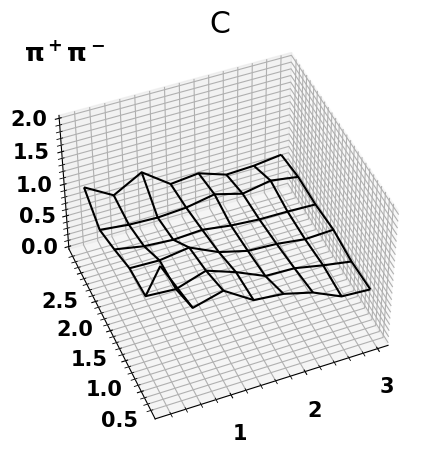

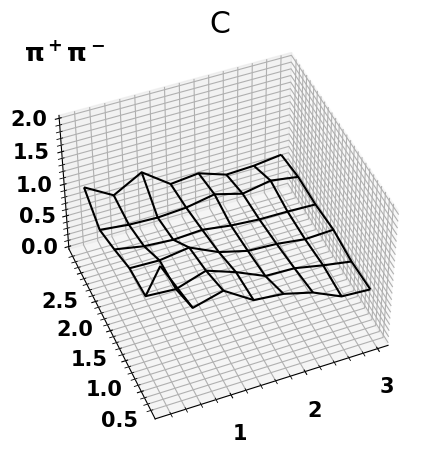

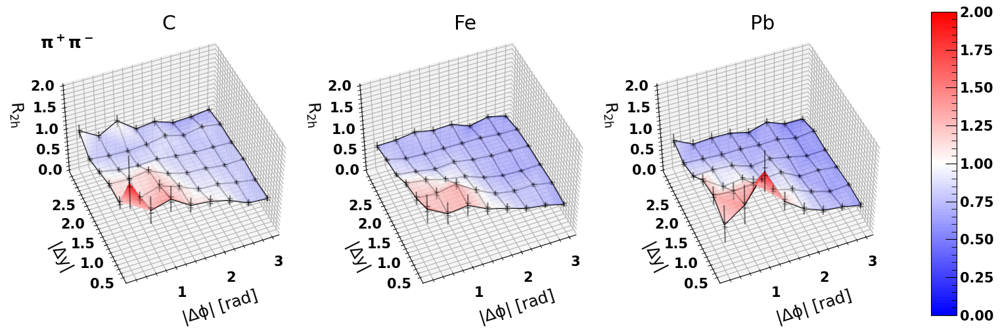

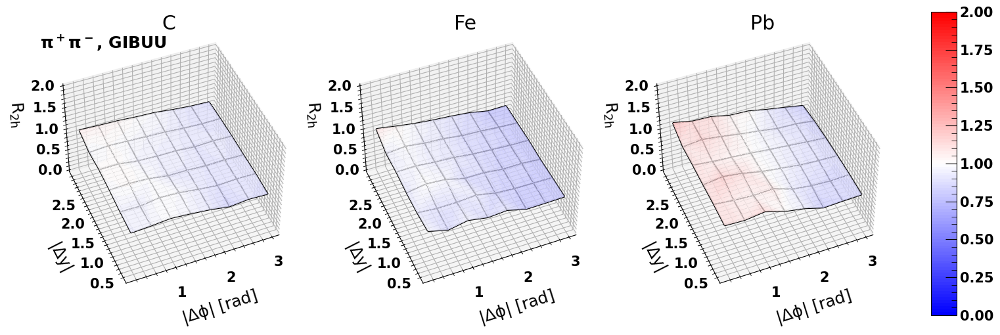

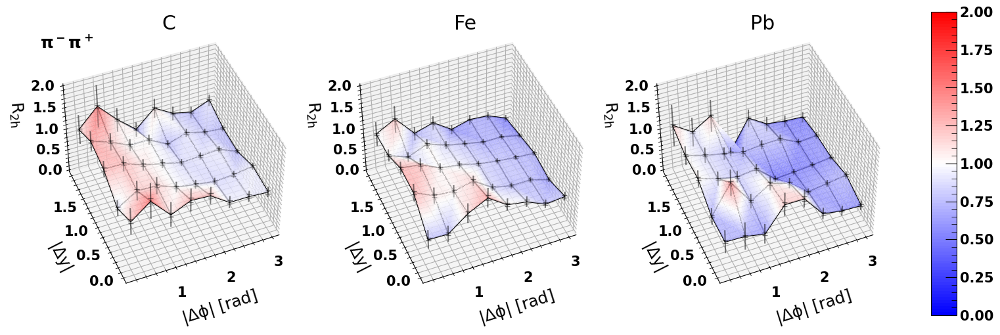

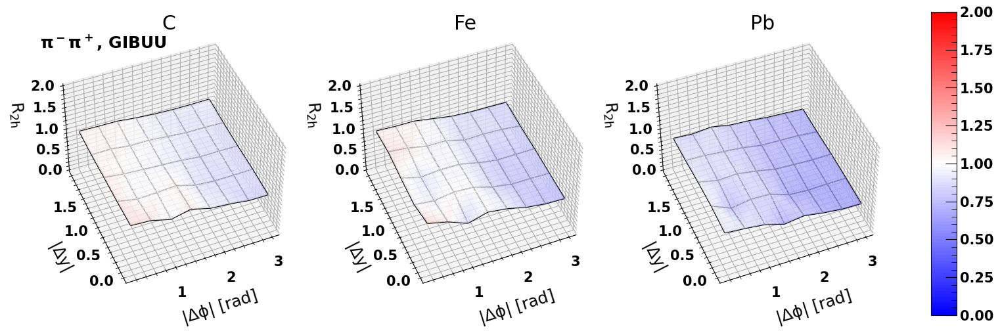

In [28]:
sysErr=[0.0425648903,
    0.03156250443,
    0.02614883064,
    0.02523107341,
    0.02533560227,
    0.02547747002,
    0.0262759471,
    0.03001707032]
make_2d_plots(dphidy, sysErr, "dphidy", "$|\Delta\phi|$ [rad]", "$|\Delta y|$ ")

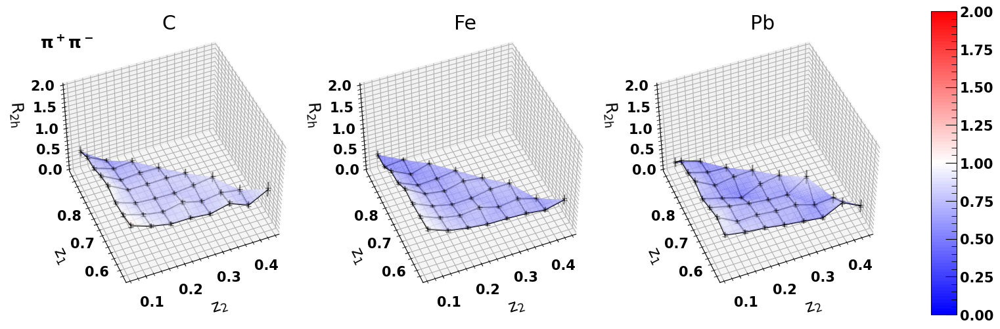

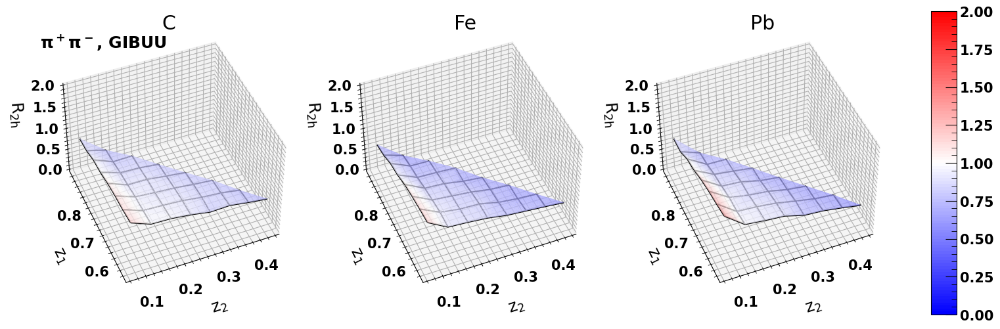

<ipython-input-27-58a5b5857ca6>:67: RuntimeWarning: invalid value encountered in double_scalars
  ax.plot([xpos[j][k], xpos[j][k]],[ypos[j][k], ypos[j][k]], [z[k][j]-totErr, z[k][j]],
<ipython-input-27-58a5b5857ca6>:69: RuntimeWarning: invalid value encountered in double_scalars
  ax.plot([xpos[j][k]],[ypos[j][k]], [z[k][j]-sysErr[j]*z[k][j]],
/home/sebouh/.local/lib/python3.8/site-packages/mpl_toolkits/mplot3d/proj3d.py:109: RuntimeWarning: invalid value encountered in true_divide
  txs, tys, tzs = vecw[0]/w, vecw[1]/w, vecw[2]/w
/home/sebouh/.local/lib/python3.8/site-packages/mpl_toolkits/mplot3d/proj3d.py:109: RuntimeWarning: invalid value encountered in true_divide
  txs, tys, tzs = vecw[0]/w, vecw[1]/w, vecw[2]/w


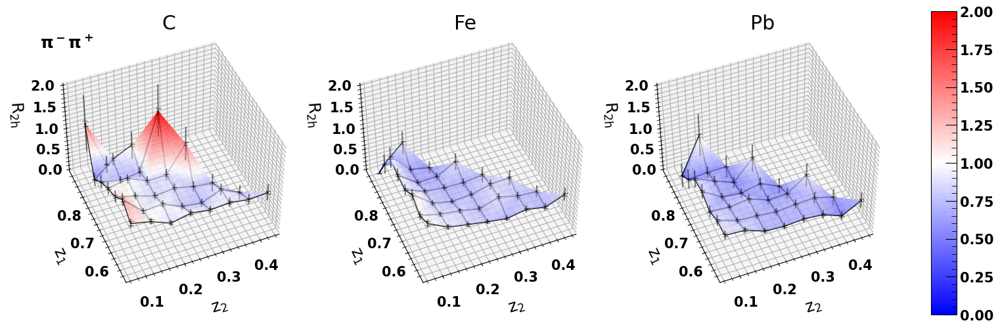

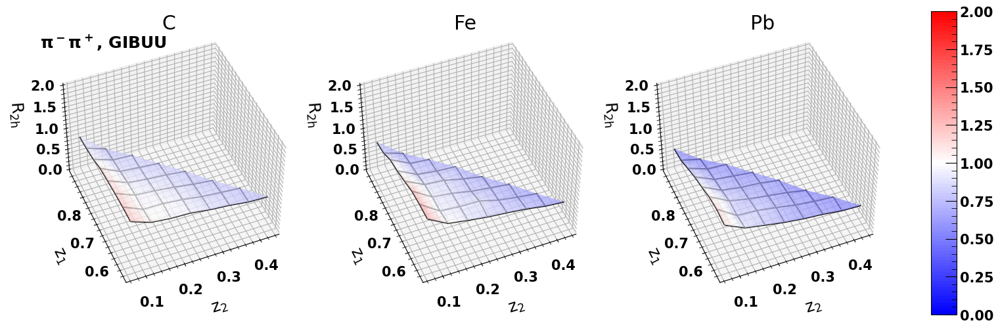

In [29]:
sysErr=[3.692202419/100,
    3.212142566/100,
    2.570701518/100,
    2.596996206/100,
    2.673649758/100,
    2.912079542/100,
    3.608299589/100,
    4.204192233/100]
make_2d_plots(z1z2, sysErr, "z1z2", "$z_2$", "$z_1$ ")

In [209]:
print(np.mean(df["C"].h1_z), np.mean(df["C"].h2_z))

0.6052948385094399 0.165387219423469


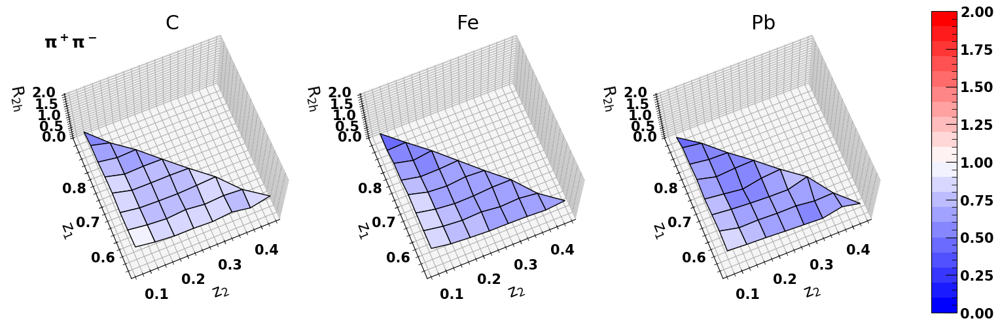

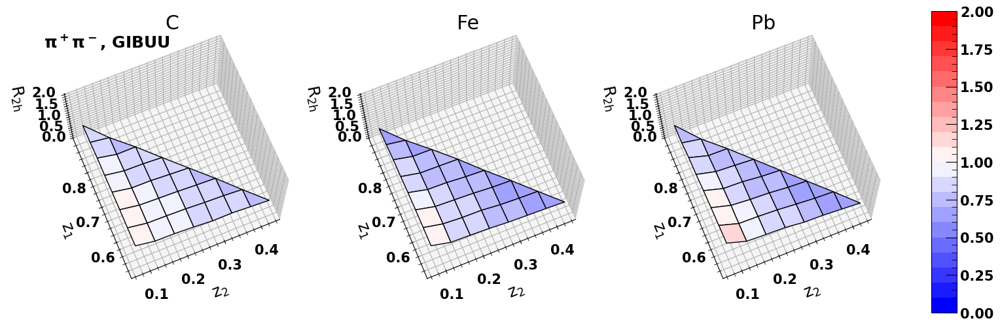

/home/sebouh/.local/lib/python3.8/site-packages/mpl_toolkits/mplot3d/proj3d.py:109: RuntimeWarning: invalid value encountered in true_divide
  txs, tys, tzs = vecw[0]/w, vecw[1]/w, vecw[2]/w
/home/sebouh/.local/lib/python3.8/site-packages/mpl_toolkits/mplot3d/proj3d.py:109: RuntimeWarning: invalid value encountered in true_divide
  txs, tys, tzs = vecw[0]/w, vecw[1]/w, vecw[2]/w


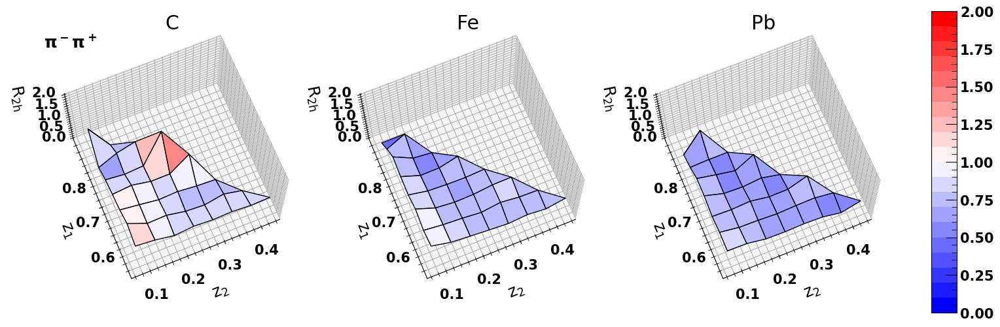

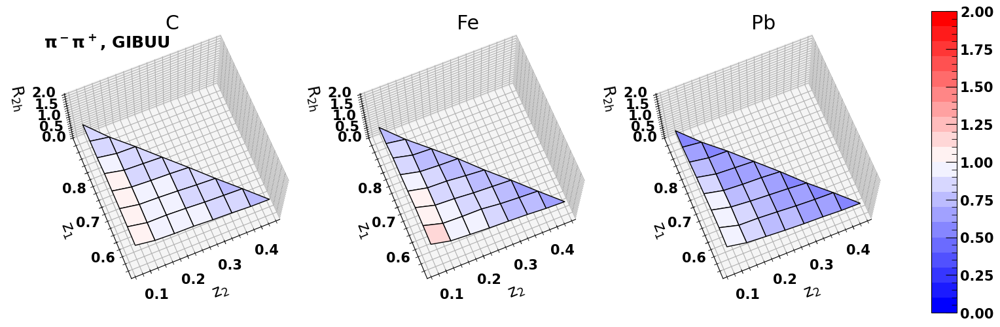

In [179]:
from matplotlib import cm
viridis = cm.get_cmap('viridis', 12)
bwr = cm.get_cmap('bwr', 20)
for charge in "+-", "-+":
    for tag in "_data", "_GiBUU":
        fig = plt.figure(figsize=(18,6))
        gs = fig.add_gridspec(ncols=4, nrows=1, width_ratios=[1,1, 1, .1])
        for i, target in enumerate("C Fe Pb".split()):
            ax = fig.add_subplot(gs[0,i], projection='3d')
            if i == 0:
                if tag == "_data":
                    ax.text2D(0.0, 0.95, f"$\pi^{charge[0]}\pi^{charge[1]}$", transform=ax.transAxes)
                if tag == "_GiBUU":
                    ax.text2D(0.0, 0.95, f"$\pi^{charge[0]}\pi^{charge[1]}$, GIBUU", transform=ax.transAxes)
            ax.set_title(target)
            ax.set_zlim(0, 2)
            elev = 70
            azim = -112.5#-135
            ax.view_init(azim=azim,elev = elev)
            z, err, x, y = z1z2[target+charge+tag]
            x = (x[1:] + x[:-1])/2.0
            y = (y[1:] + y[:-1])/2.0
            xpos, ypos= np.meshgrid(x,y)
            #print(z, xpos, ypos)
            surf=ax.plot_surface(xpos, ypos, z.transpose(), cmap=bwr,edgecolor='k',vmin=0, vmax=2)
            ax.set_xlabel("$z_2$", labelpad=15)
            ax.set_ylabel("$z_1$ ", labelpad=15)
            ax.set_zlabel("$R_{2h}$", labelpad=15)
        fig.colorbar(surf, orientation='vertical',cax=fig.add_subplot(gs[0,-1]))
        plt.savefig(f"{plots_dir}/R2h_z1z2_{charge}{tag}.png".replace("+", "p").replace("-","m"))
        plt.savefig(f"{plots_dir}R2h_z1z2_{charge}{tag}.pdf".replace("+", "p").replace("-","m"))
        plt.show()

/home/sebouh/.local/lib/python3.8/site-packages/mpl_toolkits/mplot3d/proj3d.py:109: RuntimeWarning: invalid value encountered in true_divide
  txs, tys, tzs = vecw[0]/w, vecw[1]/w, vecw[2]/w
/home/sebouh/.local/lib/python3.8/site-packages/mpl_toolkits/mplot3d/proj3d.py:109: RuntimeWarning: invalid value encountered in true_divide
  txs, tys, tzs = vecw[0]/w, vecw[1]/w, vecw[2]/w


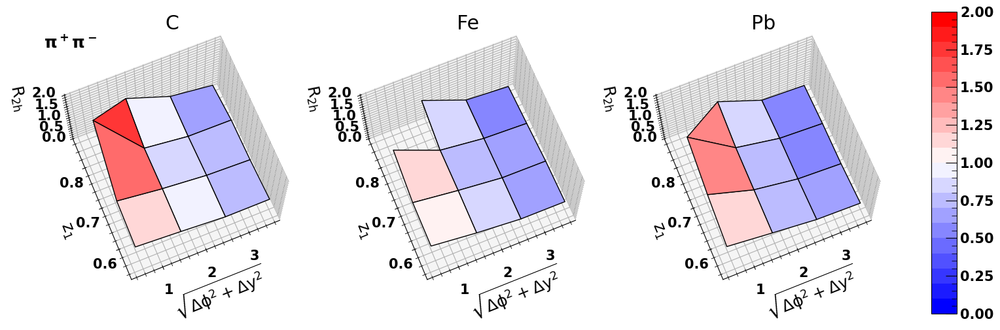

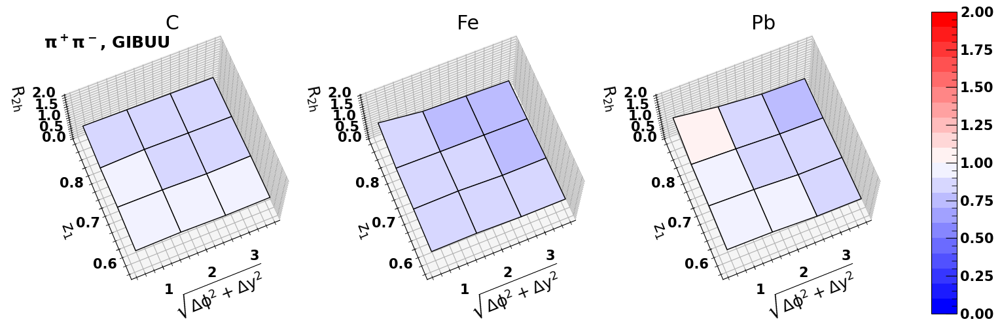

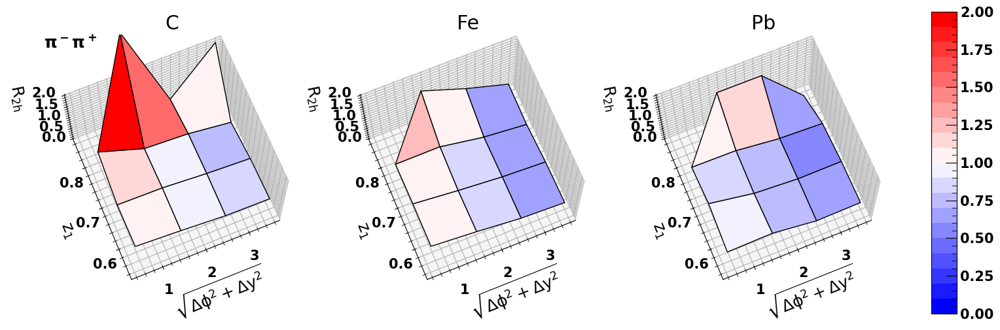

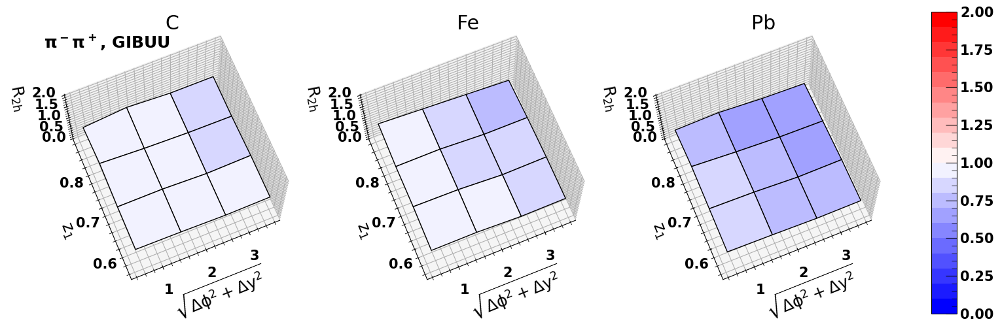

In [22]:
#z1 versus delta R=sqrt(Delta phi^2+Delta y^2)
from matplotlib import cm
viridis = cm.get_cmap('viridis', 12)
bwr = cm.get_cmap('bwr', 20)
for charge in "+-", "-+":
    for tag in "_data", "_GiBUU":
        fig = plt.figure(figsize=(18,6))
        gs = fig.add_gridspec(ncols=4, nrows=1, width_ratios=[1,1, 1, .1])
        for i, target in enumerate("C Fe Pb".split()):
            ax = fig.add_subplot(gs[0,i], projection='3d')
            if i == 0:
                if tag == "_data":
                    ax.text2D(0.0, 0.95, f"$\pi^{charge[0]}\pi^{charge[1]}$", transform=ax.transAxes)
                if tag == "_GiBUU":
                    ax.text2D(0.0, 0.95, f"$\pi^{charge[0]}\pi^{charge[1]}$, GIBUU", transform=ax.transAxes)
            ax.set_title(target)
            ax.set_zlim(0, 2)
            elev = 70
            azim = -112.5#-135
            ax.view_init(azim=azim,elev = elev)
            z, err, x, y = z1dR[target+charge+tag]
            x = (x[1:] + x[:-1])/2.0
            y = (y[1:] + y[:-1])/2.0
            xpos, ypos= np.meshgrid(x,y)
            #print(z, xpos, ypos)
            surf=ax.plot_surface(xpos, ypos, z.transpose(), cmap=bwr,edgecolor='k',vmin=0, vmax=2)
            ax.set_xlabel("$\\sqrt{\Delta\phi^2+\Delta y^2}$", labelpad=15)
            ax.set_ylabel("$z_1$ ", labelpad=15)
            ax.set_zlabel("$R_{2h}$", labelpad=15)
        fig.colorbar(surf, orientation='vertical',cax=fig.add_subplot(gs[0,-1]))
        plt.savefig(f"{plots_dir}/R2h_z1dR_{charge}{tag}.png".replace("+", "p").replace("-","m"))
        plt.savefig(f"{plots_dir}R2h_z1dR_{charge}{tag}.pdf".replace("+", "p").replace("-","m"))
        plt.show()

# create tables of values to be included in the analysis note/paper

In [166]:
pm={"+-":"pm","-+":"mp"}
for charge in "+-", "-+":
    string=" & & C & Fe & Pb \\\\\n\\hline\n"
    x = dphidy[target+charge+"_data"][2]
    y = dphidy[target+charge+"_data"][3]
    
    for i in range(len(x)-1):
        for j in range(len(y)-1):
            if j == 0:
                string= string +f"${x[i]:.2f}<\\Delta\\phi<{x[i+1]:.2f}$"
            string= string + f" & ${y[j]:.1f}<\\Delta y<{y[j+1]:.1f}$"
            for target in "C Fe Pb".split():
               string= string+f" & ${float(dphidy[target+charge+'_data'][0][i][j]):.3f}\\pm{dphidy[target+charge+'_data'][1][i][j]:.3f}$"
            string= string + "\\\\\n"
        string += "\\hline\n"
    f = open(tables_dir+f"/dphidy_{pm[charge]}_data.tex", "w")
    f.write(string)
    f.close()
    print("data, dphidy", charge)
    print(string)
    
for charge in "+-", "-+":
    string=" & & C & Fe & Pb \\\\\n"
    x = z1z2[target+charge+"_data"][2]
    y = z1z2[target+charge+"_data"][3]
    
    for j in range(len(y)-1):
        for i in range(len(x)-1):
            if i == 0:
                line = f"\\hline\n${y[j]:.2f}<z_1<{y[j+1]:.2f}$"
            else :
                line =""
            line +=f" & ${x[i]:.2f}<z_2<{x[i+1]:.2f}$"
            for target in "C Fe Pb".split():
               line += f" & ${float(z1z2[target+charge+'_data'][0][i][j]):.3f}\\pm{z1z2[target+charge+'_data'][1][i][j]:.3f}$"
            line+="\\\\\n"
            if "nan" not in line:
                string+= line
    string+="\\hline"
    f = open(tables_dir+f"/z1z2_{pm[charge]}_data.tex", "w")
    f.write(string)
    f.close()
    print("data, z1z2", charge)
    print(string)

data, dphidy +-
 & & C & Fe & Pb \\
\hline
$0.00<\Delta\phi<0.39$ & $0.0<\Delta y<0.5$ & $2.088\pm0.575$ & $1.495\pm0.312$ & $1.137\pm0.418$\\
 & $0.5<\Delta y<1.0$ & $1.165\pm0.127$ & $1.269\pm0.125$ & $1.331\pm0.188$\\
 & $1.0<\Delta y<1.5$ & $1.127\pm0.083$ & $1.145\pm0.074$ & $1.228\pm0.116$\\
 & $1.5<\Delta y<2.0$ & $0.960\pm0.060$ & $0.895\pm0.049$ & $0.862\pm0.073$\\
 & $2.0<\Delta y<2.5$ & $0.816\pm0.058$ & $0.804\pm0.051$ & $0.715\pm0.072$\\
 & $2.5<\Delta y<3.0$ & $1.044\pm0.135$ & $0.684\pm0.082$ & $0.814\pm0.146$\\
\hline
$0.39<\Delta\phi<0.79$ & $0.0<\Delta y<0.5$ & $1.322\pm0.299$ & $1.246\pm0.239$ & $1.450\pm0.438$\\
 & $0.5<\Delta y<1.0$ & $1.134\pm0.127$ & $1.241\pm0.117$ & $1.289\pm0.182$\\
 & $1.0<\Delta y<1.5$ & $1.113\pm0.076$ & $1.089\pm0.063$ & $0.934\pm0.088$\\
 & $1.5<\Delta y<2.0$ & $0.876\pm0.050$ & $0.838\pm0.043$ & $0.877\pm0.070$\\
 & $2.0<\Delta y<2.5$ & $0.765\pm0.052$ & $0.699\pm0.045$ & $0.690\pm0.069$\\
 & $2.5<\Delta y<3.0$ & $0.792\pm0.100$ & $0.696

# Chi2 test and plots

In [260]:
for key in df.keys():
    if not "GiBUU" in key:
        df[key].eval("theta1 = arcsin(h1_cm_pt/h2_p)*(2*(h1_rap+ycm>0)-1)+3.14159*(h1_rap+ycm<0)", inplace=True)
        df[key].eval("theta2 = arcsin(h2_cm_pt/h2_p)*(2*(h2_rap+ycm>0)-1)+3.14159*(h2_rap+ycm<0)", inplace=True)
        df[key].eval("thetaavg = (theta1+theta2)/2", inplace=True)
        
        df[key].eval('dthetatot = arccos(cos(theta1)*cos(theta2)+sin(theta1)*sin(theta2)*cos(dphi))', inplace=True)

#delta phi versus delta theta tot

import imp
import R2h_module_2d as r2h
imp.reload(r2h)
#theta tot, dphi
def all2D(xvar,yvar,  bins):
    
    results={}
    trigger_cut_pid = {"+-":" and h1_pid==211","-+":" and h1_pid==-211"}
    for charge in "+-", "-+":
        for target in "C Fe Pb".split():

            results[target+charge+"_data"]=r2h.getRatio2d(df['%s'%target], df['D_%s'%target], 
                                    df_trigger['%s_trigger'%target], df_trigger['D_%s_trigger'%target],
                                    varx=xvar, vary=yvar, bins=bins,
                                        pair_cut = '%s and h2_z>0.05 and h2_z<0.45 and h1_cm_pt**2>0.005 and h2_cm_pt**2>0.005 and h1_z+h2_z<0.95'%pair_cut_nom,
                                        trig_cut = '%s'%trigger_cut_nom +trigger_cut_pid[charge] + " and h1_cm_pt**2>0.005")
            """dphidthtot[target+charge+"_GiBUU"]=r2h.getRatio2d(df['GiBUU_%s'%target],df['GiBUU_D'],
                                    df_trigger['GiBUU_%s_trigger'%target],df_trigger['GiBUU_D_trigger'],
                                    varx="dphi", vary='drap', bins=[np.linspace(0, np.pi, 9), binsdy[charge]],
                                        pair_cut='and h2_z>0.05 and h2_z<0.45 and h1_z+h2_z<0.95',
                                       trig_cut='h1_z>0.5'+trigger_cut_pid[charge])"""

    return results

def makeplots(results,tag,xlabel, ylabel):

    from matplotlib import cm
    viridis = cm.get_cmap('viridis', 12)
    bwr = cm.get_cmap('bwr', 100)
    for charge in "+-", "-+":
        for tag in "_data",:
            fig = plt.figure(figsize=(18,6))
            gs = fig.add_gridspec(ncols=4, nrows=1, width_ratios=[1,1, 1, .1])
            for i, target in enumerate("C Fe Pb".split()):
                ax = fig.add_subplot(gs[0,i], projection='3d')
                if i == 0:
                    if tag == "_data":
                        ax.text2D(0.0, 0.95, f"$\pi^{charge[0]}\pi^{charge[1]}$", transform=ax.transAxes)
                    if tag == "_GiBUU":
                        ax.text2D(0.0, 0.95, f"$\pi^{charge[0]}\pi^{charge[1]}$, GIBUU", transform=ax.transAxes)
                ax.set_title(target)
                ax.set_zlim(0.5, 1.5)
                elev = 70
                azim = -112.5#-135
                ax.view_init(azim=azim,elev = elev)
                z, err, x, y = results[target+charge+tag]
                x = (x[1:] + x[:-1])/2.0
                y = (y[1:] + y[:-1])/2.0
                xpos, ypos= np.meshgrid(x,y)
                
                
                import copy
                z= copy.deepcopy(z)
                
                #clean up values... don't show values if the error bar is more than 30% of the extracted value. 
                # set them to NaN so that they are not shown
#                 for j in range(len(z)):
#                     for k in range(len(z[0])):
#                         if np.isnan(z[j][k]) or np.isnan(err[j][k]):
#                             continue
#                         elif err[j][k]>z[j][k]*.5:
#                             z[j][k] = np.nan
                            
                        
                
                #print(z, xpos, ypos)
                surf=ax.plot_surface(xpos, ypos, z.transpose(), cmap=bwr,edgecolor='k',vmin=0.5, vmax=1.5)
                ax.set_xlabel(xlabel, labelpad=15)
                ax.set_ylabel(ylabel, labelpad=15)
                ax.set_zlabel("$R_{2h}$", labelpad=15)
            fig.colorbar(surf, orientation='vertical',cax=fig.add_subplot(gs[0,-1]))
            plt.savefig(f"{plots_dir}/R2h_{tag}_{charge}{tag}.png".replace("+", "p").replace("-","m"))
            plt.savefig(f"{plots_dir}R2h_{tag}_{charge}{tag}.pdf".replace("+", "p").replace("-","m"))

            plt.show()
def chi2test(results, sysErr):
    from scipy.stats import norm  as normlib
    from scipy.stats import chi2  as chi2lib
    
    chi2all=0
    Ndofall=0
    maxResidAll=0
    for charge in "+-", "-+":
        for target in "C Fe Pb".split():
            z, err, x, y =results[target+charge+"_data"]
            #if charge=="+-" and target=="C":
            #    print(z)
            chi2tot=0
            Ndof=0
            maxResid=0


            for i in range(len(z)):
                sumZW = 0
                sumW = 0
                sumZZW = 0
                
                for j in range(len(z[0])):
                    W=1/(err[i][j]**2+(z[i][j]*sysErr[j])**2)
                    if not np.isnan(z[i][j]) and not np.isinf(z[i][j]):
                        sumW += W
                        sumZW += z[i][j]*W
                        sumZZW += z[i][j]**2*W
                        Ndof+=1
                if sumW== 0:
                    continue
                avg=sumZW/sumW
                Ndof-=1
                #sum((z-avg)*(z-avg)/W)
                chi2val= sumZZW-2*avg*sumZW+avg**2*sumW
                for jj in range(len(z[0])):
                    if not np.isnan(z[i][jj]) and not np.isinf(z[i][jj]):
                         maxResid=max(maxResid,(z[i][jj]-avg)/err[i][jj])

                #print(chi2val)
                if not np.isnan(chi2val):
                    chi2tot+=chi2val
                maxResidAll = max(maxResid,maxResidAll)
            print(f"chi2tot: {chi2tot:.2f}; ndof: {Ndof}; p={chi2lib.sf(chi2tot,Ndof)}; maxzval={maxResid:2}")
            from scipy.stats import chi2  as chi2lib

            chi2all+=chi2tot
            Ndofall+=Ndof

    print(f"chi2all: {chi2all:.2f}; ndof: {Ndofall}; maxResidAll={maxResidAll}; p_LEE={1-(1-normlib.sf(maxResidAll))**Ndofall}")
    print("p=",chi2lib.sf(chi2all,Ndofall))

# Azimuth vs total angle

In [159]:
#plt.hist(df['C'].dthetatot,bins=100)
#plt.show()
print([df['C'].dthetatot.quantile(q) for q in (0,.17,.33,.5,.67,.83,1)])

[0.01662134960665564, 0.5894886911415244, 0.7973206564153398, 1.0117969201111316, 1.2456393516007813, 1.548298811465564, 3.0167861998301815]


/home/sebouh/di-hadron/R2h_module_2d.py:52: RuntimeWarning: invalid value encountered in true_divide
  ratio_conditional = np.true_divide(z_A,z_D)
/home/sebouh/di-hadron/R2h_module_2d.py:54: RuntimeWarning: divide by zero encountered in true_divide
  error_conditional=ratio_conditional*np.sqrt(1/n_A+1/n_D)
/home/sebouh/di-hadron/R2h_module_2d.py:54: RuntimeWarning: invalid value encountered in multiply
  error_conditional=ratio_conditional*np.sqrt(1/n_A+1/n_D)
/home/sebouh/di-hadron/R2h_module_2d.py:52: RuntimeWarning: divide by zero encountered in true_divide
  ratio_conditional = np.true_divide(z_A,z_D)


chi2tot: 39.60; ndof: 35; p=0.27196692467924216; maxzval=2.257309436260967
chi2tot: 48.42; ndof: 36; p=0.08079104357837039; maxzval=3.612997403362264
chi2tot: 27.42; ndof: 35; p=0.8158504919720602; maxzval=2.4441995557244347
chi2tot: 34.86; ndof: 29; p=0.20902565708822468; maxzval=2.1279074840859207
chi2tot: 42.98; ndof: 32; p=0.09308402262061523; maxzval=2.8521983618651228
chi2tot: 28.53; ndof: 33; p=0.6893206627078969; maxzval=2.3762129450365657
chi2all: 221.82; ndof: 200; maxResidAll=3.612997403362264; p_LEE=0.029816513629681962
p= 0.13855906546289895


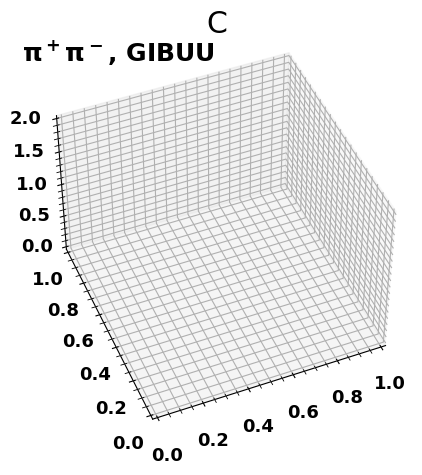

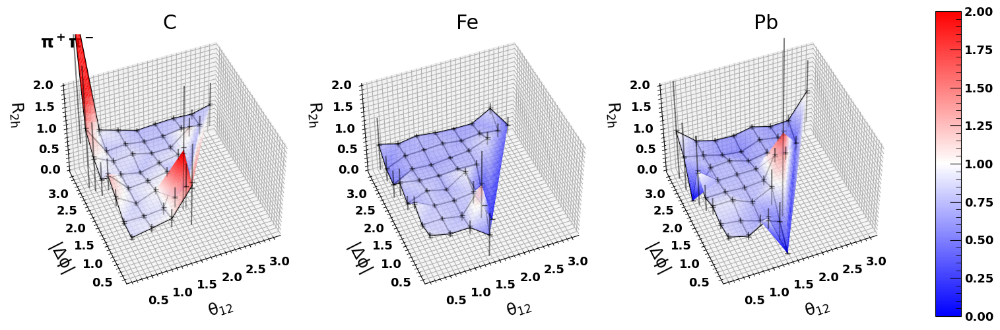

/home/sebouh/.local/lib/python3.8/site-packages/matplotlib/tri/triinterpolate.py:276: RuntimeWarning: invalid value encountered in add
  return (self._plane_coefficients[tri_index, 0]*x +
<ipython-input-258-dfdb1e2276be>:65: RuntimeWarning: invalid value encountered in double_scalars
  ax.plot([xpos[j][k], xpos[j][k]],[ypos[j][k], ypos[j][k]], [z[k][j]-totErr, z[k][j]],
<ipython-input-258-dfdb1e2276be>:67: RuntimeWarning: invalid value encountered in double_scalars
  ax.plot([xpos[j][k]],[ypos[j][k]], [z[k][j]-sysErr[j]*z[k][j]],
/home/sebouh/.local/lib/python3.8/site-packages/mpl_toolkits/mplot3d/proj3d.py:109: RuntimeWarning: invalid value encountered in true_divide
  txs, tys, tzs = vecw[0]/w, vecw[1]/w, vecw[2]/w
/home/sebouh/.local/lib/python3.8/site-packages/mpl_toolkits/mplot3d/proj3d.py:109: RuntimeWarning: invalid value encountered in true_divide
  txs, tys, tzs = vecw[0]/w, vecw[1]/w, vecw[2]/w


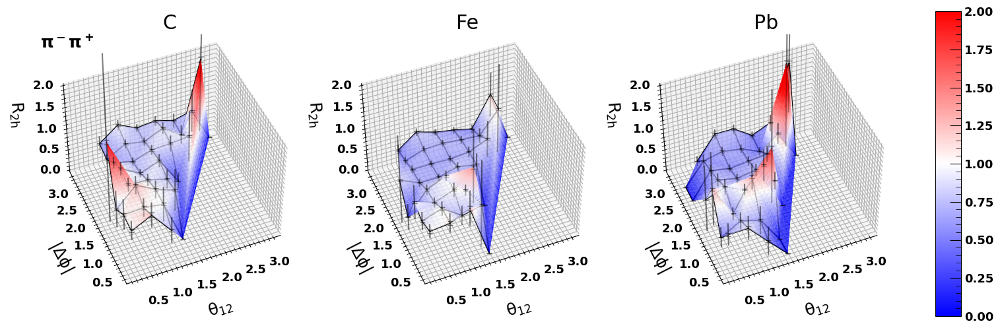

In [259]:
results = all2D("dthetatot", 'dphi',[np.linspace(0, np.pi, 9), np.linspace(0, np.pi, 9)])
sysErr=np.multiply(0.01,[4.2564890, 3.156250443, 2.614883064, 2.523107341, 
                     2.533560227, 2.547747002, 2.62759471, 3.001707032])
chi2test(results, sysErr)
#makeplots(results,)
make_2d_plots(results, sysErr, "dthetatot_vs_dphi","$\\theta_{12}$","$|\Delta\phi|$",interpolate=True,dataOnly=True)
plt.show()

# Theta2 vs  total angle

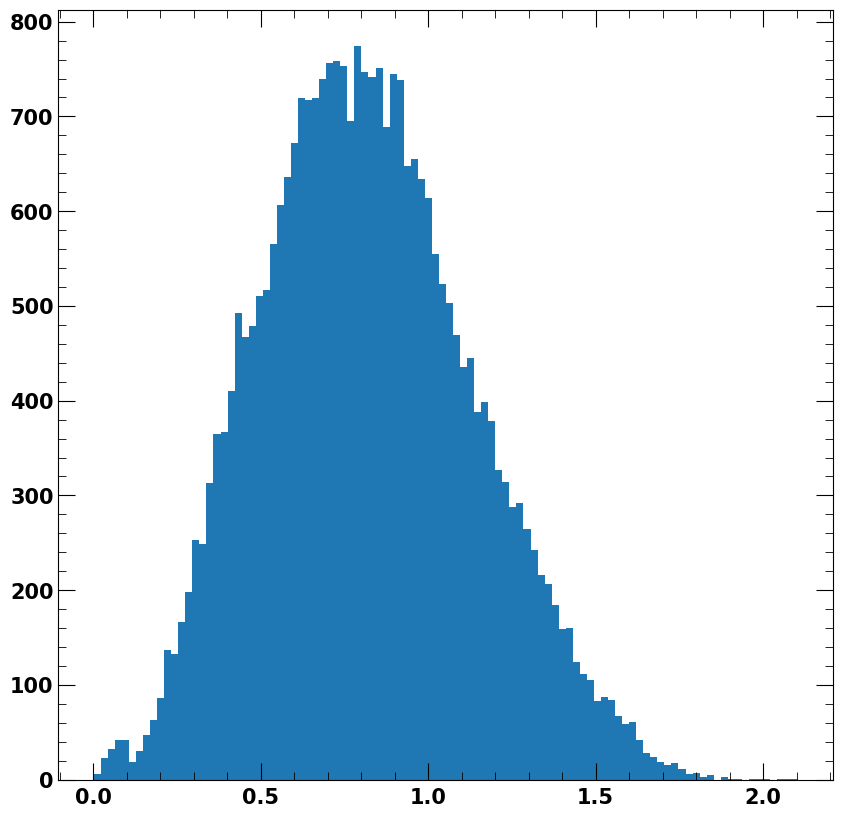

In [161]:
plt.hist(df['C'].theta2, bins=100); plt.show()

/home/sebouh/di-hadron/R2h_module_2d.py:52: RuntimeWarning: invalid value encountered in true_divide
  ratio_conditional = np.true_divide(z_A,z_D)
/home/sebouh/di-hadron/R2h_module_2d.py:54: RuntimeWarning: divide by zero encountered in true_divide
  error_conditional=ratio_conditional*np.sqrt(1/n_A+1/n_D)
/home/sebouh/di-hadron/R2h_module_2d.py:54: RuntimeWarning: invalid value encountered in multiply
  error_conditional=ratio_conditional*np.sqrt(1/n_A+1/n_D)
/home/sebouh/di-hadron/R2h_module_2d.py:52: RuntimeWarning: divide by zero encountered in true_divide
  ratio_conditional = np.true_divide(z_A,z_D)


chi2tot: 36.43; ndof: 25; p=0.06526383268706555; maxzval=2.5656978396051464
chi2tot: 25.82; ndof: 25; p=0.41731001398436846; maxzval=2.4473575238467404
chi2tot: 22.43; ndof: 25; p=0.6106861652463949; maxzval=2.0549916243103943
chi2tot: 16.02; ndof: 23; p=0.8544201863145338; maxzval=1.591065660439664
chi2tot: 27.82; ndof: 24; p=0.2677588330140728; maxzval=1.6346922360100173
chi2tot: 8.97; ndof: 24; p=0.9976504203142648; maxzval=1.4554554413016603
chi2all: 137.50; ndof: 146; maxResidAll=2.5656978396051464; p_LEE=0.5293363444397519
p= 0.6802228655863451


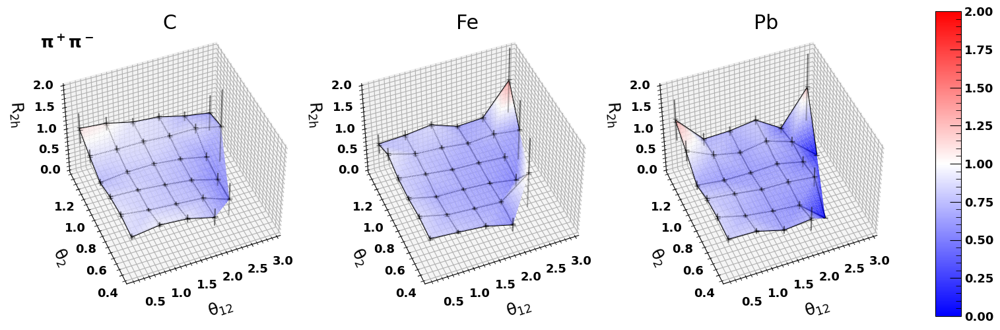

<ipython-input-258-dfdb1e2276be>:65: RuntimeWarning: invalid value encountered in double_scalars
  ax.plot([xpos[j][k], xpos[j][k]],[ypos[j][k], ypos[j][k]], [z[k][j]-totErr, z[k][j]],
<ipython-input-258-dfdb1e2276be>:67: RuntimeWarning: invalid value encountered in double_scalars
  ax.plot([xpos[j][k]],[ypos[j][k]], [z[k][j]-sysErr[j]*z[k][j]],
/home/sebouh/.local/lib/python3.8/site-packages/mpl_toolkits/mplot3d/proj3d.py:109: RuntimeWarning: invalid value encountered in true_divide
  txs, tys, tzs = vecw[0]/w, vecw[1]/w, vecw[2]/w
/home/sebouh/.local/lib/python3.8/site-packages/mpl_toolkits/mplot3d/proj3d.py:109: RuntimeWarning: invalid value encountered in true_divide
  txs, tys, tzs = vecw[0]/w, vecw[1]/w, vecw[2]/w


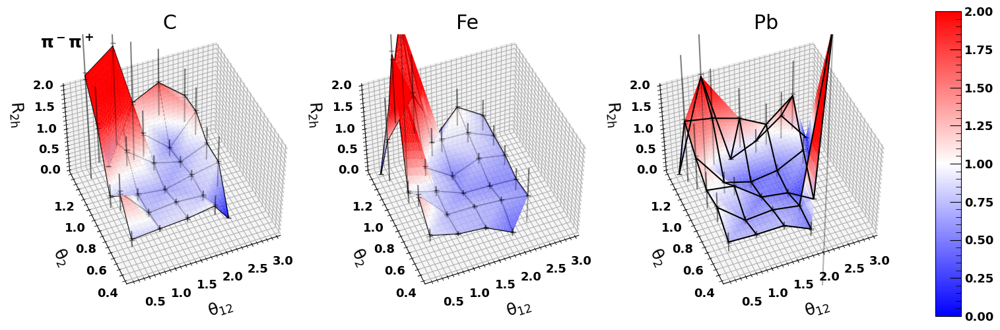

In [265]:
#results = all2D("dthetatot", 'theta2',[np.linspace(0, np.pi, 0), np.linspace(0, np.pi, 9)])
results = all2D("dthetatot", 'theta2',[ np.linspace(0, np.pi, 7),np.linspace(.3, 1.4, 7)])
sysErr=np.multiply(0.01,[2.5]*10)
chi2test(results, sysErr)
make_2d_plots(results,sysErr,"dthetatot_vs_dphi","$\\theta_{12}$","$\\theta_2$",interpolate=True,dataOnly=True)

# Azimuth vs relativistic separation

/home/sebouh/di-hadron/R2h_module_2d.py:52: RuntimeWarning: invalid value encountered in true_divide
  ratio_conditional = np.true_divide(z_A,z_D)
/home/sebouh/di-hadron/R2h_module_2d.py:54: RuntimeWarning: divide by zero encountered in true_divide
  error_conditional=ratio_conditional*np.sqrt(1/n_A+1/n_D)
/home/sebouh/di-hadron/R2h_module_2d.py:54: RuntimeWarning: invalid value encountered in multiply
  error_conditional=ratio_conditional*np.sqrt(1/n_A+1/n_D)


chi2tot: 28.61; ndof: 25; p=0.2806936108694184; maxzval=1.7264527452227207
chi2tot: 14.94; ndof: 26; p=0.9584243819678867; maxzval=3.0202604801401884
chi2tot: 22.22; ndof: 26; p=0.6767531125778434; maxzval=1.6392292866712217
chi2tot: 8.88; ndof: 16; p=0.9182292001466459; maxzval=1.4568850840582923
chi2tot: 8.86; ndof: 17; p=0.9446705896561552; maxzval=1.8807164356675208
chi2tot: 18.41; ndof: 16; p=0.3006910177752113; maxzval=1.9617919666288575
chi2all: 101.91; ndof: 126; maxResidAll=3.0202604801401884; p_LEE=0.1471841967482671
p= 0.9434312500629353


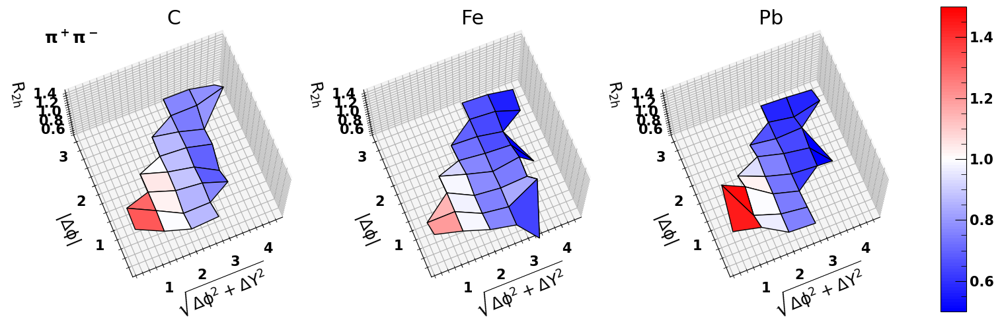

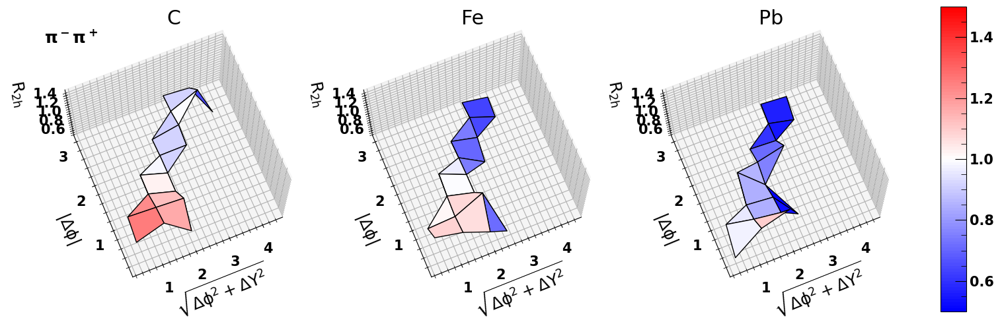

In [150]:
for key in df.keys():
    if not "GiBUU" in key:
        df[key].eval('Rsep=sqrt(dphi**2+drap**2)', inplace=True)

results = all2D("Rsep", 'dphi',[np.linspace(0, np.pi*3/2, 7), np.linspace(0, np.pi, 9)])

sysErr=np.multiply(0.01,[4.2564890, 3.156250443, 2.614883064, 2.523107341, 
                     2.533560227, 2.547747002, 2.62759471, 3.001707032])
chi2test(results, sysErr)
makeplots(results,"Rsep_vs_dphi","$\\sqrt{\\Delta\\phi^2+\\Delta Y^2}$","$|\Delta\phi|$")
#delta phi versus delta theta tot

/home/sebouh/di-hadron/R2h_module_2d.py:52: RuntimeWarning: divide by zero encountered in true_divide
  ratio_conditional = np.true_divide(z_A,z_D)
/home/sebouh/di-hadron/R2h_module_2d.py:52: RuntimeWarning: invalid value encountered in true_divide
  ratio_conditional = np.true_divide(z_A,z_D)
/home/sebouh/di-hadron/R2h_module_2d.py:54: RuntimeWarning: divide by zero encountered in true_divide
  error_conditional=ratio_conditional*np.sqrt(1/n_A+1/n_D)
/home/sebouh/di-hadron/R2h_module_2d.py:54: RuntimeWarning: invalid value encountered in multiply
  error_conditional=ratio_conditional*np.sqrt(1/n_A+1/n_D)


chi2tot: 19.64; ndof: 26; p=0.8083813009027887; maxzval=1.815195100835763
chi2tot: 11.88; ndof: 28; p=0.9966638691902415; maxzval=1.375185359427061
chi2tot: 19.12; ndof: 28; p=0.8944439962021236; maxzval=2.3046103448920814
chi2tot: 10.93; ndof: 20; p=0.9479664019088414; maxzval=1.7260096011673014
chi2tot: 2.44; ndof: 21; p=0.9999997761205127; maxzval=0.7300669824511298
chi2tot: 7.54; ndof: 21; p=0.9968149848479988; maxzval=1.3931933237974106
chi2all: 71.55; ndof: 144; maxResidAll=2.3046103448920814; p_LEE=0.7842648636006563
p= 0.9999999337368478


/home/sebouh/.local/lib/python3.8/site-packages/mpl_toolkits/mplot3d/proj3d.py:109: RuntimeWarning: invalid value encountered in true_divide
  txs, tys, tzs = vecw[0]/w, vecw[1]/w, vecw[2]/w
/home/sebouh/.local/lib/python3.8/site-packages/mpl_toolkits/mplot3d/proj3d.py:109: RuntimeWarning: invalid value encountered in true_divide
  txs, tys, tzs = vecw[0]/w, vecw[1]/w, vecw[2]/w


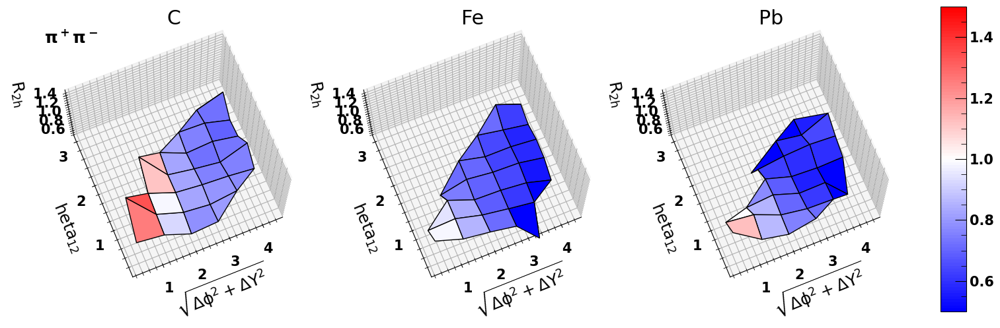

/home/sebouh/.local/lib/python3.8/site-packages/mpl_toolkits/mplot3d/proj3d.py:109: RuntimeWarning: invalid value encountered in true_divide
  txs, tys, tzs = vecw[0]/w, vecw[1]/w, vecw[2]/w


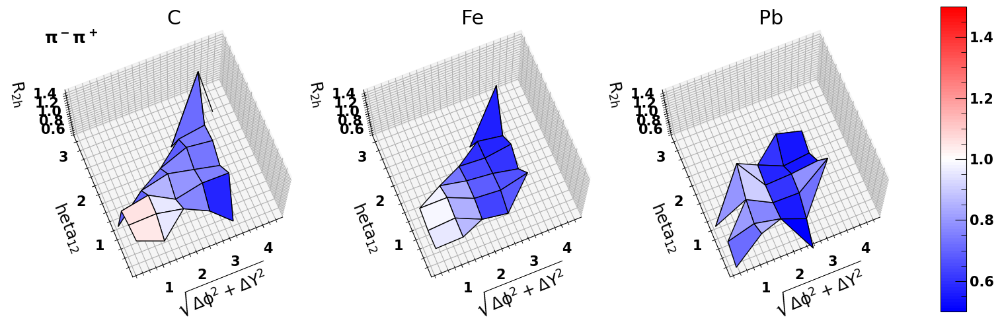

In [151]:
results = all2D("Rsep", 'dthetatot',[np.linspace(0, np.pi*3/2, 7), np.linspace(0, np.pi, 9)])

sysErr=np.multiply(0.01,[3.0]*8)
chi2test(results, sysErr)
makeplots(results,"Rsep_vs_dthetatot","$\\sqrt{\\Delta\\phi^2+\\Delta Y^2}$","$\theta_{12}$")

/home/sebouh/di-hadron/R2h_module_2d.py:52: RuntimeWarning: invalid value encountered in true_divide
  ratio_conditional = np.true_divide(z_A,z_D)
/home/sebouh/di-hadron/R2h_module_2d.py:54: RuntimeWarning: divide by zero encountered in true_divide
  error_conditional=ratio_conditional*np.sqrt(1/n_A+1/n_D)
/home/sebouh/di-hadron/R2h_module_2d.py:54: RuntimeWarning: invalid value encountered in multiply
  error_conditional=ratio_conditional*np.sqrt(1/n_A+1/n_D)
/home/sebouh/di-hadron/R2h_module_2d.py:52: RuntimeWarning: divide by zero encountered in true_divide
  ratio_conditional = np.true_divide(z_A,z_D)


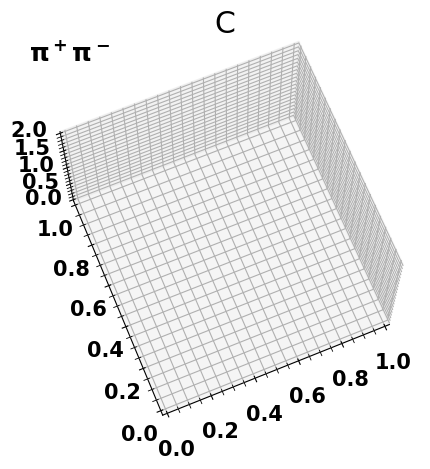

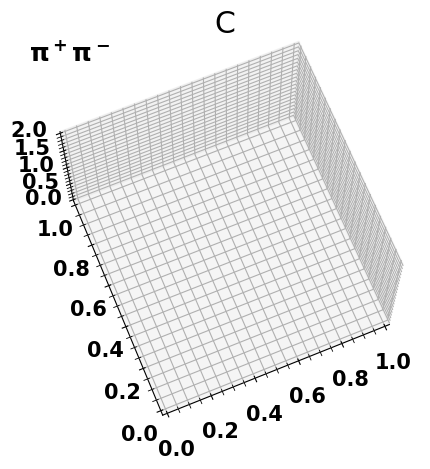

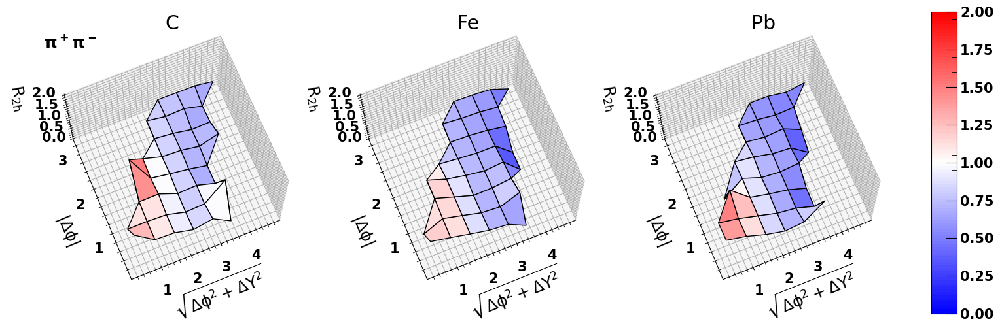

/home/sebouh/.local/lib/python3.8/site-packages/mpl_toolkits/mplot3d/proj3d.py:109: RuntimeWarning: invalid value encountered in true_divide
  txs, tys, tzs = vecw[0]/w, vecw[1]/w, vecw[2]/w
/home/sebouh/.local/lib/python3.8/site-packages/mpl_toolkits/mplot3d/proj3d.py:109: RuntimeWarning: invalid value encountered in true_divide
  txs, tys, tzs = vecw[0]/w, vecw[1]/w, vecw[2]/w


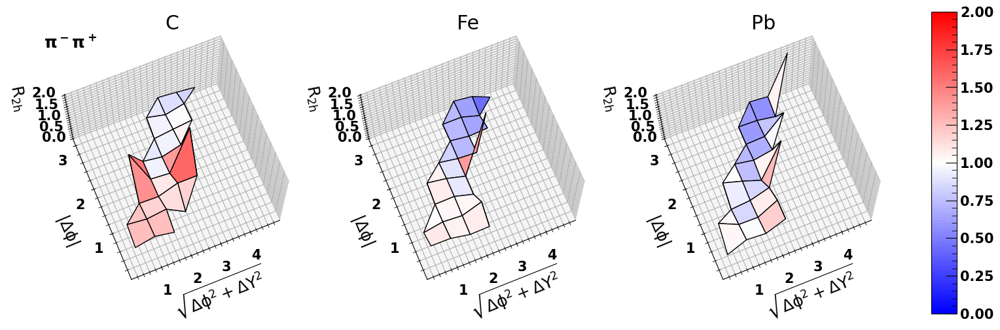

In [118]:
import imp
import R2h_module_2d as r2h
imp.reload(r2h)
dphihypot={}
#R, dphi
bins=[np.linspace(0, np.pi, 9), np.linspace(0, np.pi, 9)]
bins=[np.linspace(0, 5, 9), np.linspace(0, np.pi, 9)]
trigger_cut_pid = {"+-":" and h1_pid==211","-+":" and h1_pid==-211"}
for charge in "+-", "-+":
    for target in "C Fe Pb".split():
        
        dphihypot[target+charge+"_data"]=r2h.getRatio2d(df['%s'%target], df['D_%s'%target], 
                                df_trigger['%s_trigger'%target], df_trigger['D_%s_trigger'%target],
                                varx="Rsep", vary='dphi', bins=bins,
                                    pair_cut = '%s and h2_z>0.05 and h2_z<0.45 and h1_cm_pt**2>0.005 and h2_cm_pt**2>0.005 and h1_z+h2_z<0.95'%pair_cut_nom,
                                    trig_cut = '%s'%trigger_cut_nom +trigger_cut_pid[charge] + " and h1_cm_pt**2>0.005")
        """dphidthtot[target+charge+"_GiBUU"]=r2h.getRatio2d(df['GiBUU_%s'%target],df['GiBUU_D'],
                                df_trigger['GiBUU_%s_trigger'%target],df_trigger['GiBUU_D_trigger'],
                                varx="dphi", vary='drap', bins=[np.linspace(0, np.pi, 9), binsdy[charge]],
                                    pair_cut='and h2_z>0.05 and h2_z<0.45 and h1_z+h2_z<0.95',
                                   trig_cut='h1_z>0.5'+trigger_cut_pid[charge])"""
        



from matplotlib import cm
viridis = cm.get_cmap('viridis', 12)
bwr = cm.get_cmap('bwr', 100)
for charge in "+-", "-+":
    for tag in "_data",:
        fig = plt.figure(figsize=(18,6))
        gs = fig.add_gridspec(ncols=4, nrows=1, width_ratios=[1,1, 1, .1])
        for i, target in enumerate("C Fe Pb".split()):
            ax = fig.add_subplot(gs[0,i], projection='3d')
            if i == 0:
                if tag == "_data":
                    ax.text2D(0.0, 0.95, f"$\pi^{charge[0]}\pi^{charge[1]}$", transform=ax.transAxes)
                if tag == "_GiBUU":
                    ax.text2D(0.0, 0.95, f"$\pi^{charge[0]}\pi^{charge[1]}$, GIBUU", transform=ax.transAxes)
            ax.set_title(target)
            ax.set_zlim(0, 2)
            elev = 70
            azim = -112.5#-135
            ax.view_init(azim=azim,elev = elev)
            z, err, x, y = dphihypot[target+charge+tag]
            x = (x[1:] + x[:-1])/2.0
            y = (y[1:] + y[:-1])/2.0
            xpos, ypos= np.meshgrid(x,y)
            #print(z, xpos, ypos)
            surf=ax.plot_surface(xpos, ypos, z.transpose(), cmap=bwr,edgecolor='k',vmin=0, vmax=2)
            ax.set_xlabel("$\\sqrt{\\Delta\\phi^2+\\Delta Y^2}$", labelpad=15)
            ax.set_ylabel("$|\Delta\phi|$ ", labelpad=15)
            ax.set_zlabel("$R_{2h}$", labelpad=15)
        fig.colorbar(surf, orientation='vertical',cax=fig.add_subplot(gs[0,-1]))
        plt.savefig(f"{plots_dir}/R2h_z1dR_{charge}{tag}.png".replace("+", "p").replace("-","m"))
        plt.savefig(f"{plots_dir}R2h_z1dR_{charge}{tag}.pdf".replace("+", "p").replace("-","m"))

        plt.show()

In [74]:

from scipy.stats import norm  as normlib
from scipy.stats import chi2  as chi2lib
sysErrs={"+-":np.multiply(0.01,[4.2564890, 3.156250443, 2.614883064, 2.523107341, 
                 2.533560227, 2.547747002, 2.62759471, 3.001707032])}
sysErrs["-+"] = np.sqrt(sysErrs["+-"]**2-.01**2) #remove the part from the Cerenkov
chi2all=0
Ndofall=0
maxResidAll=0
for charge in "+-", "-+":
    for target in "C Fe Pb".split():
        z, err, x, y =dphihypot[target+charge+"_data"]
        #if charge=="+-" and target=="C":
        #    print(z)
        chi2tot=0
        Ndof=0
        maxResid=0
        
        
        for i in range(len(z)):
            sumZW = 0
            sumW = 0
            sumZZW = 0
            for j in range(len(z[0])):
                W=1/(err[i][j]**2+(z[i][j]*sysErrs[charge][j])**2)
                if not np.isnan(z[i][j]) and not np.isinf(z[i][j]):
                    sumW += W
                    sumZW += z[i][j]*W
                    sumZZW += z[i][j]**2*W
                    Ndof+=1
            if sumW== 0:
                continue
            avg=sumZW/sumW
            Ndof-=1
            #sum((z-avg)*(z-avg)/W)
            chi2val= sumZZW-2*avg*sumZW+avg**2*sumW
            for jj in range(len(z[0])):
                if not np.isnan(z[i][jj]) and not np.isinf(z[i][jj]):
                     maxResid=max(maxResid,(z[i][jj]-avg)/err[i][jj])
            
            #print(chi2val)
            if not np.isnan(chi2val):
                chi2tot+=chi2val
            maxResidAll = max(maxResid,maxResidAll)
        print(f"{target} {charge} chi2tot: {chi2tot:.2f}; ndof: {Ndof}; p={chi2lib.sf(chi2tot,Ndof)}; maxzval={maxResid:2}")
        from scipy.stats import chi2  as chi2lib
        
        chi2all+=chi2tot
        Ndofall+=Ndof

print(f"chi2all: {chi2all:.2f}; ndof: {Ndofall}; maxResidAll={maxResidAll}; p_LEE={1-(1-normlib.sf(maxResidAll))**Ndofall}")
print("p=",chi2lib.sf(chi2all,Ndofall))
print

C +- chi2tot: 30.90; ndof: 31; p=0.47108762235762724; maxzval=2.228805954792871
Fe +- chi2tot: 24.39; ndof: 32; p=0.83006389506256; maxzval=2.367155932690255
Pb +- chi2tot: 34.55; ndof: 31; p=0.3018908671691611; maxzval=2.7696502771275724
C -+ chi2tot: 14.57; ndof: 20; p=0.8005902541893724; maxzval=1.550358523813369
Fe -+ chi2tot: 9.56; ndof: 20; p=0.9753998657161146; maxzval=1.1971200595923919
Pb -+ chi2tot: 14.80; ndof: 20; p=0.7876744518677176; maxzval=1.5500792429108388
chi2all: 128.78; ndof: 154; maxResidAll=2.7696502771275724; p_LEE=0.35124780556152246
p= 0.9313178647439165


<function print>

In [ ]:
# rapidity avg vs hypot

In [54]:
for key in df.keys():
    if not "GiBUU" in key:
        df[key].eval('rapavg=(h1_rap+h2_rap)/2', inplace=True)
        df[key].eval('Rsep=sqrt(dphi**2+drap**2)', inplace=True)

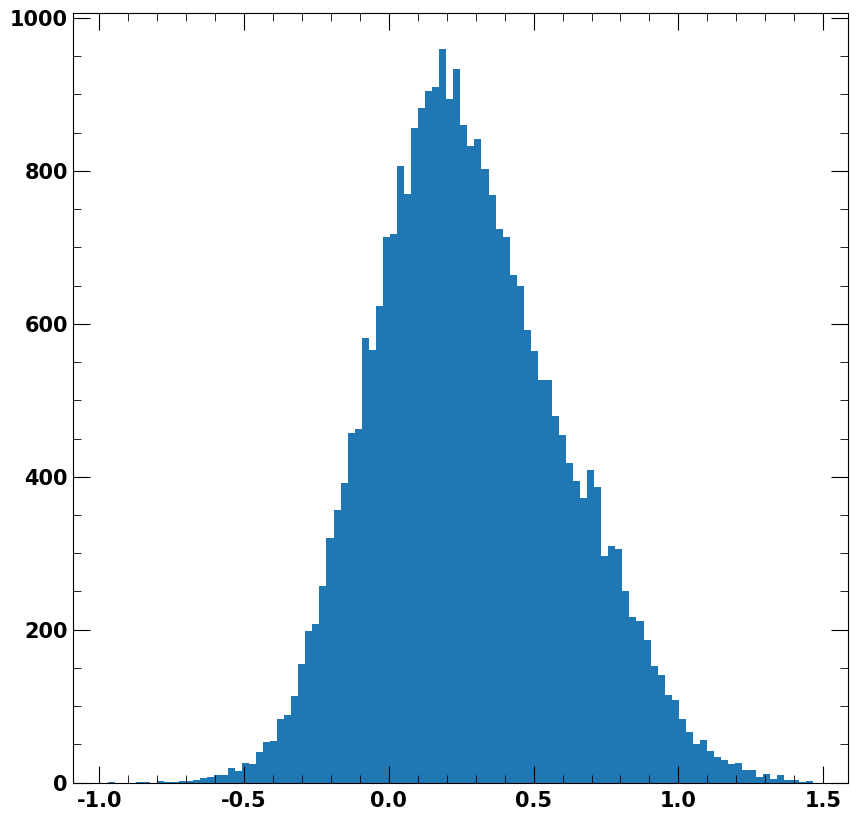

In [75]:
plt.hist(df["C"].rapavg,bins=100)
plt.show()

/home/sebouh/di-hadron/R2h_module_2d.py:52: RuntimeWarning: divide by zero encountered in true_divide
  ratio_conditional = np.true_divide(z_A,z_D)
/home/sebouh/di-hadron/R2h_module_2d.py:52: RuntimeWarning: invalid value encountered in true_divide
  ratio_conditional = np.true_divide(z_A,z_D)
/home/sebouh/di-hadron/R2h_module_2d.py:54: RuntimeWarning: divide by zero encountered in true_divide
  error_conditional=ratio_conditional*np.sqrt(1/n_A+1/n_D)
/home/sebouh/di-hadron/R2h_module_2d.py:54: RuntimeWarning: invalid value encountered in multiply
  error_conditional=ratio_conditional*np.sqrt(1/n_A+1/n_D)
/home/sebouh/.local/lib/python3.8/site-packages/mpl_toolkits/mplot3d/proj3d.py:109: RuntimeWarning: invalid value encountered in true_divide
  txs, tys, tzs = vecw[0]/w, vecw[1]/w, vecw[2]/w


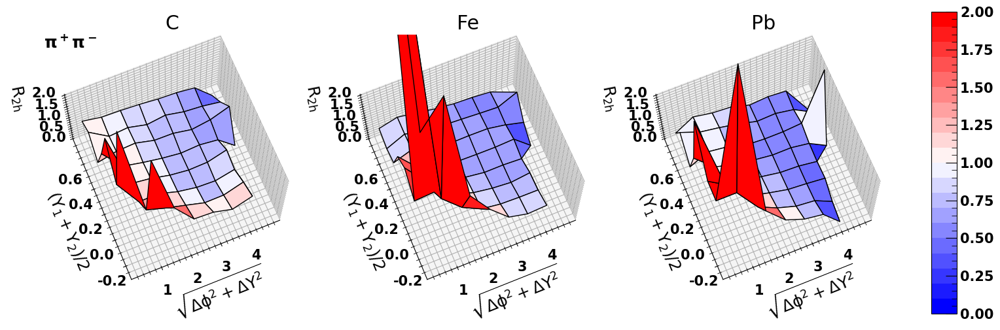

/home/sebouh/.local/lib/python3.8/site-packages/mpl_toolkits/mplot3d/proj3d.py:109: RuntimeWarning: invalid value encountered in true_divide
  txs, tys, tzs = vecw[0]/w, vecw[1]/w, vecw[2]/w


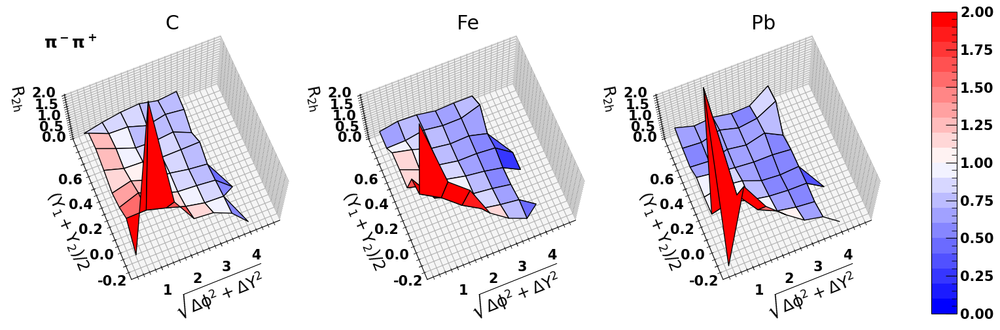

In [76]:
#delta phi versus delta theta tot

import imp
import R2h_module_2d as r2h
imp.reload(r2h)
yavghypot={}
#R, rapavg
bins=[np.linspace(0, 5, 9), np.linspace(-.3, 0.8, 9)]
trigger_cut_pid = {"+-":" and h1_pid==211","-+":" and h1_pid==-211"}
for charge in "+-", "-+":
    for target in "C Fe Pb".split():
        
        yavghypot[target+charge+"_data"]=r2h.getRatio2d(df['%s'%target], df['D_%s'%target], 
                                df_trigger['%s_trigger'%target], df_trigger['D_%s_trigger'%target],
                                varx="Rsep", vary='rapavg', bins=bins,
                                    pair_cut = '%s and h2_z>0.05 and h2_z<0.45 and h1_cm_pt**2>0.005 and h2_cm_pt**2>0.005 and h1_z+h2_z<0.95'%pair_cut_nom,
                                    trig_cut = '%s'%trigger_cut_nom +trigger_cut_pid[charge] + " and h1_cm_pt**2>0.005")
        """dphidthtot[target+charge+"_GiBUU"]=r2h.getRatio2d(df['GiBUU_%s'%target],df['GiBUU_D'],
                                df_trigger['GiBUU_%s_trigger'%target],df_trigger['GiBUU_D_trigger'],
                                varx="dphi", vary='drap', bins=[np.linspace(0, np.pi, 9), binsdy[charge]],
                                    pair_cut='and h2_z>0.05 and h2_z<0.45 and h1_z+h2_z<0.95',
                                   trig_cut='h1_z>0.5'+trigger_cut_pid[charge])"""
        



from matplotlib import cm
viridis = cm.get_cmap('viridis', 12)
bwr = cm.get_cmap('bwr', 100)
for charge in "+-", "-+":
    for tag in "_data",:
        fig = plt.figure(figsize=(18,6))
        gs = fig.add_gridspec(ncols=4, nrows=1, width_ratios=[1,1, 1, .1])
        for i, target in enumerate("C Fe Pb".split()):
            ax = fig.add_subplot(gs[0,i], projection='3d')
            if i == 0:
                if tag == "_data":
                    ax.text2D(0.0, 0.95, f"$\pi^{charge[0]}\pi^{charge[1]}$", transform=ax.transAxes)
                if tag == "_GiBUU":
                    ax.text2D(0.0, 0.95, f"$\pi^{charge[0]}\pi^{charge[1]}$, GIBUU", transform=ax.transAxes)
            ax.set_title(target)
            ax.set_zlim(0, 2)
            elev = 70
            azim = -112.5#-135
            ax.view_init(azim=azim,elev = elev)
            z, err, x, y = yavghypot[target+charge+tag]
            x = (x[1:] + x[:-1])/2.0
            y = (y[1:] + y[:-1])/2.0
            xpos, ypos= np.meshgrid(x,y)
            #print(z, xpos, ypos)
            surf=ax.plot_surface(xpos, ypos, z.transpose(), cmap=bwr,edgecolor='k',vmin=0, vmax=2)
            ax.set_xlabel("$\\sqrt{\\Delta\\phi^2+\\Delta Y^2}$", labelpad=15)
            ax.set_ylabel("$(Y_1+Y_2)/2$", labelpad=15)
            ax.set_zlabel("$R_{2h}$", labelpad=15)
        fig.colorbar(surf, orientation='vertical',cax=fig.add_subplot(gs[0,-1]))
        plt.savefig(f"{plots_dir}/R2h_z1dR_{charge}{tag}.png".replace("+", "p").replace("-","m"))
        plt.savefig(f"{plots_dir}R2h_z1dR_{charge}{tag}.pdf".replace("+", "p").replace("-","m"))

        plt.show()

In [77]:

from scipy.stats import norm  as normlib
from scipy.stats import chi2  as chi2lib
sysErrs=np.multiply(0.01,[2.5]*8)
chi2all=0
Ndofall=0
maxResidAll=0
for charge in "+-", "-+":
    for target in "C Fe Pb".split():
        z, err, x, y =yavghypot[target+charge+"_data"]
        #if charge=="+-" and target=="C":
        #    print(z)
        chi2tot=0
        Ndof=0
        maxResid=0
        
        
        for i in range(len(z)):
            sumZW = 0
            sumW = 0
            sumZZW = 0
            for j in range(len(z[0])):
                W=1/(err[i][j]**2+(z[i][j]*sysErrs[j])**2)
                if not np.isnan(z[i][j]) and not np.isinf(z[i][j]):
                    sumW += W
                    sumZW += z[i][j]*W
                    sumZZW += z[i][j]**2*W
                    Ndof+=1
            if sumW== 0:
                continue
            avg=sumZW/sumW
            Ndof-=1
            #sum((z-avg)*(z-avg)/W)
            chi2val= sumZZW-2*avg*sumZW+avg**2*sumW
            for jj in range(len(z[0])):
                if not np.isnan(z[i][jj]) and not np.isinf(z[i][jj]):
                     maxResid=max(maxResid,(z[i][jj]-avg)/err[i][jj])
            
            #print(chi2val)
            if not np.isnan(chi2val):
                chi2tot+=chi2val
            maxResidAll = max(maxResid,maxResidAll)
        print(f"{target} {charge} chi2tot: {chi2tot:.2f}; ndof: {Ndof}; p={chi2lib.sf(chi2tot,Ndof)}; maxzval={maxResid:2}")
        from scipy.stats import chi2  as chi2lib
        
        chi2all+=chi2tot
        Ndofall+=Ndof

print(f"chi2all: {chi2all:.2f}; ndof: {Ndofall}; maxResidAll={maxResidAll}; p_LEE={1-(1-normlib.sf(maxResidAll))**Ndofall}")
print("p=",chi2lib.sf(chi2all,Ndofall))
print

C +- chi2tot: 199.05; ndof: 51; p=2.2803670457613094e-19; maxzval=6.645042086951464
Fe +- chi2tot: 315.91; ndof: 51; p=7.043708677287007e-40; maxzval=7.623731993518188
Pb +- chi2tot: 136.95; ndof: 50; p=5.055899770619545e-10; maxzval=4.239051186659516
C -+ chi2tot: 85.69; ndof: 43; p=0.00011731709237206272; maxzval=3.1925595884334017
Fe -+ chi2tot: 162.79; ndof: 44; p=1.557492247598308e-15; maxzval=4.502386016230164
Pb -+ chi2tot: 90.53; ndof: 43; p=3.0838688254282375e-05; maxzval=3.275009694161807
chi2all: 990.92; ndof: 282; maxResidAll=7.623731993518188; p_LEE=3.475220111681665e-12
p= 1.379445692832366e-79


<function print>